Connected to Python (voxelmorph-env)

2025-02-20 14:58:14.308750: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-02-20 14:58:14.376425: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-20 14:58:14.379914: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/kchand/miniconda3/lib:/usr/local/cuda-12.4

Predicting for sample: sample7
1/1 [==============================] - 0s 156ms/step
Time taken to test one sample: 6.62 minutes


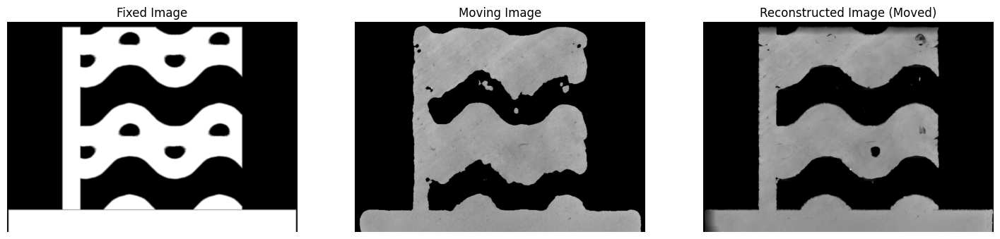

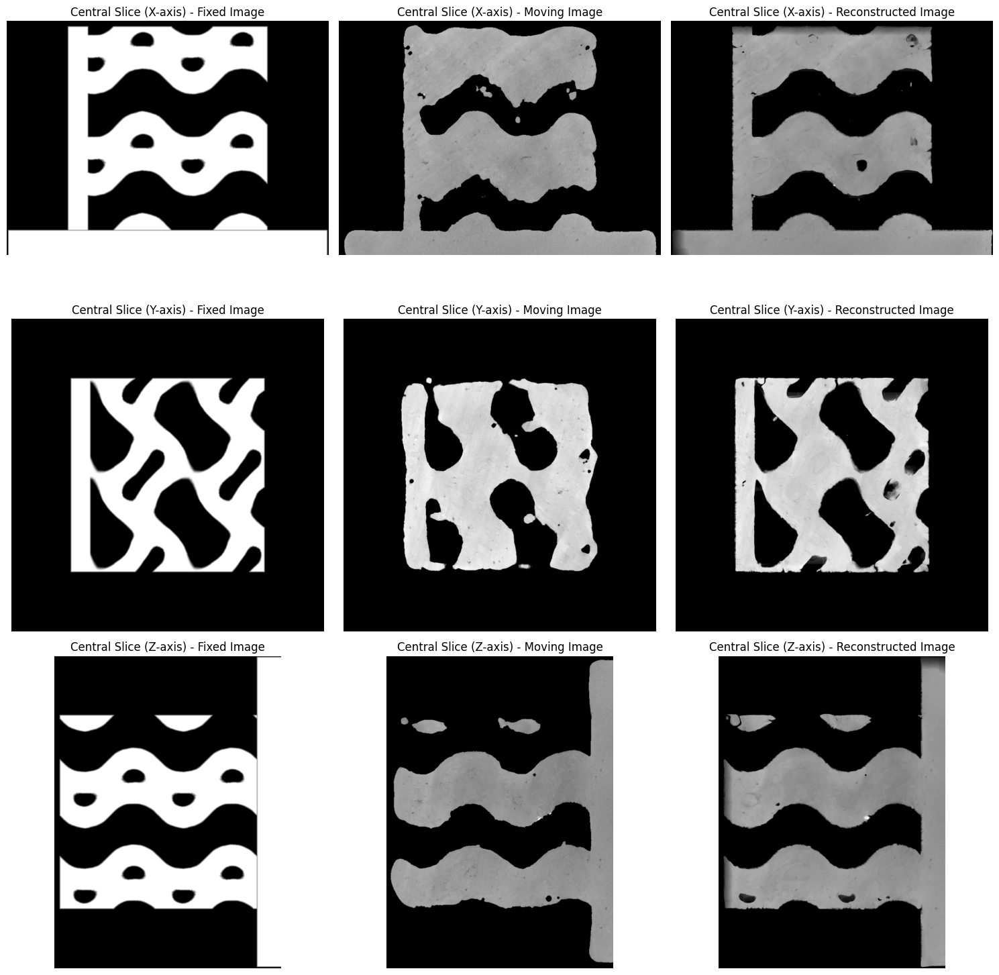

Dice score before non-linear registration on test data is: 0.8213
Dice score after non-linear registration on test data is: 0.9463


In [1]:
import os
import h5py
import numpy as np
import tensorflow as tf
import tifffile as tiff
import voxelmorph as vxm
import matplotlib.pyplot as plt
import pyvista as pv
import pandas as pd
import time
from skimage import filters

# Set GPU device
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
tf.get_logger().setLevel('ERROR')


def save_as_tiff(image, filename):
    """
    Function to save a 3D numpy array as a TIFF file.
    
    Args:
        image (numpy array): The 3D image to be saved.
        filename (str): The filename where the image will be saved.
    """
    tiff.imwrite(filename, image)

def save_image_as_vtk(moved_image, filename):
    # Create a PyVista grid for the moved image
    moved_image_shape = moved_image.shape
    x = np.arange(moved_image_shape[0])
    y = np.arange(moved_image_shape[1])
    z = np.arange(moved_image_shape[2])
    grid = pv.StructuredGrid(*np.meshgrid(x, y, z, indexing="ij"))

    # Add the moved image data to the grid
    grid["image"] = moved_image.flatten(order="F")  # Flatten in Fortran order

    # Save the moved image grid to a VTK file
    grid.save(filename)

# Function to save the displacement vector field as a VTK file
def save_displacement_vector_as_vtk(displacement_vector, filename):
    # Create a PyVista grid for the displacement vector
    vector_shape = displacement_vector.shape[:-1]
    x = np.arange(vector_shape[0])
    y = np.arange(vector_shape[1])
    z = np.arange(vector_shape[2])
    grid = pv.StructuredGrid(*np.meshgrid(x, y, z, indexing="ij"))

    # Add the displacement vector data to the grid
    vectors = np.zeros((np.prod(vector_shape), 3))
    for i in range(3):
        vectors[:, i] = displacement_vector[..., i].flatten(order="F")
    grid["displacement"] = vectors

    # Save the displacement vector grid to a VTK file
    grid.save(filename)

def get_middle_region(volume):
    """
    Extract the middle third region of the 3D volume to avoid outer areas with air.
    
    Args:
        volume (numpy array): The 3D volume.
        
    Returns:
        numpy array: The extracted middle region of the 3D volume.
    """
    # Define the start and end points for the middle third in each dimension
    start_x, end_x = volume.shape[0] // 3, 2 * volume.shape[0] // 3
    start_y, end_y = volume.shape[1] // 3, 2 * volume.shape[1] // 3
    start_z, end_z = volume.shape[2] // 3, 2 * volume.shape[2] // 3
    
    # Extract the middle region
    middle_region = volume[start_x:end_x, start_y:end_y, start_z:end_z]    
    return middle_region

def global_otsu_thresholding(data, roi=None):
    # Flatten the 3D CT data to a 1D array
    if roi is not None:
        # Apply the ROI to the data

        flattened_data = roi.flatten()
    else:
        # Flatten the entire data if ROI is not specified
        flattened_data = data.flatten()

    # Apply Otsu's thresholding to the flattened data
    threshold = filters.threshold_otsu(flattened_data)

    # Threshold the entire CT data
    thresholded_data = (data >= threshold).astype(np.uint8) * 1

    return thresholded_data

def dice_coefficient(volume_A, volume_B):

    # Get the middle third region of the volumes
    roi_A = get_middle_region(volume_A)
    roi_B = get_middle_region(volume_B)

    #binarize the volumes
    volume_A = global_otsu_thresholding(volume_A, roi=roi_A)
    volume_B = global_otsu_thresholding(volume_B, roi=roi_B)

    #make sure diemsion is same
    min_dim0 = min(volume_A.shape[0], volume_B.shape[0])
    min_dim1 = min(volume_A.shape[1], volume_B.shape[1])
    min_dim2 = min(volume_A.shape[2], volume_B.shape[2])

    volume_A = volume_A[:min_dim0, :min_dim1, :min_dim2]
    volume_B = volume_B[:min_dim0, :min_dim1, :min_dim2]

    #calculate the dice score
    volume_A = np.array(volume_A, dtype=np.float64)
    volume_B = np.array(volume_B, dtype=np.float64)
    intersection = np.sum(np.logical_and(volume_A, volume_B))
    total_voxels_A = np.sum(volume_A)
    total_voxels_B = np.sum(volume_B)
    dice = (2.0 * intersection) / (total_voxels_A + total_voxels_B)
    return dice

def plot_images(fixed_image, moving_image, reconstructed_image, slice_idx=None):
    """
    Function to plot the fixed image, moving image, and reconstructed image (moved image)
    after testing on a single slice.
    
    Args:
        fixed_image (numpy array): The fixed image volume.
        moving_image (numpy array): The moving image volume.
        reconstructed_image (numpy array): The reconstructed image volume (moved image).
        slice_idx (int, optional): The index of the slice to visualize. If None, the middle slice is used.
    """
    # If no slice index is provided, use the middle slice
    if slice_idx is None:
        slice_idx = fixed_image.shape[0] // 2  # Middle slice of the 3D volume

    # Plotting
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot fixed image
    axes[0].imshow(fixed_image[slice_idx, :, :], cmap='gray')
    axes[0].set_title("Fixed Image")
    axes[0].axis('off')

    # Plot moving image
    axes[1].imshow(moving_image[slice_idx, :, :], cmap='gray')
    axes[1].set_title("Moving Image")
    axes[1].axis('off')

    # Plot reconstructed (moved) image
    axes[2].imshow(reconstructed_image[slice_idx, :, :], cmap='gray')
    axes[2].set_title("Reconstructed Image (Moved)")
    axes[2].axis('off')

    plt.show()



def plot_3x3_images(fixed_image, moving_image, reconstructed_image):
    """
    Function to plot a 3x3 grid for fixed, moving, and moved images.
    The central slices from the x, y, and z axes are visualized.
    
    Args:
        fixed_image (numpy array): The fixed image volume.
        moving_image (numpy array): The moving image volume.
        reconstructed_image (numpy array): The reconstructed image volume (moved image).
    """
    # Calculate central indices for each axis
    center_x = fixed_image.shape[0] // 2
    center_y = fixed_image.shape[1] // 2
    center_z = fixed_image.shape[2] // 2

    # Prepare slices from x, y, and z axes
    fixed_slices = [fixed_image[center_x, :, :], fixed_image[:, center_y, :], fixed_image[:, :, center_z]]
    moving_slices = [moving_image[center_x, :, :], moving_image[:, center_y, :], moving_image[:, :, center_z]]
    reconstructed_slices = [reconstructed_image[center_x, :, :], reconstructed_image[:, center_y, :], reconstructed_image[:, :, center_z]]

    # Titles for subplots
    row_titles = ["Central Slice (X-axis)", "Central Slice (Y-axis)", "Central Slice (Z-axis)"]
    column_titles = ["Fixed Image", "Moving Image", "Reconstructed Image"]

    # Plotting
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))

    for i in range(3):  # For each axis
        # Plot fixed, moving, and reconstructed images for each axis
        axes[i, 0].imshow(fixed_slices[i], cmap='gray')
        axes[i, 0].set_title(f"{row_titles[i]} - {column_titles[0]}")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(moving_slices[i], cmap='gray')
        axes[i, 1].set_title(f"{row_titles[i]} - {column_titles[1]}")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(reconstructed_slices[i], cmap='gray')
        axes[i, 2].set_title(f"{row_titles[i]} - {column_titles[2]}")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

import numpy as np
import h5py
import time

def gaussian_weight(shape, sigma=0.5):
    """Generate a Gaussian weighting function to reduce block artifacts."""
    z, y, x = np.meshgrid(
        np.linspace(-1, 1, shape[0]), 
        np.linspace(-1, 1, shape[1]), 
        np.linspace(-1, 1, shape[2]), indexing='ij')
    weight = np.exp(-(x**2 + y**2 + z**2) / (2 * sigma**2))
    return weight / np.max(weight)  # Normalize to max 1

def test_data_generator(hdf5_file, patch_size=(128, 128, 128), stride=(64, 64, 64)):
    """
    Generator that extracts consecutive patches from a 3D volume, processes them, 
    and then stitches them back together for one sample.

    Args:
        hdf5_file: Path to the HDF5 file containing the volume data.
        patch_size: Size of the 3D patches to extract.
        stride: The step size between consecutive patches.
    
    Yields:
        A tuple of stitched volumes (moved image, displacement field) reconstructed from the processed patches.
    """
    hf = h5py.File(hdf5_file, 'r')
    num_samples = len(hf.keys()) // 2  # Assuming paired 'static' and 'moving' datasets
    
    for idx in range(num_samples):
        start_time = time.time()
        sample_name = hf[f'static_{idx}'].attrs.get('sample_name', f'sample_{idx}')
        print(f'Predicting for sample: {sample_name}')
        
        vol_shape = hf[f'static_{idx}'].shape
        moving_image = hf[f'moving_{idx}'][...]
        fixed_image = hf[f'static_{idx}'][...]
        
        # Calculate padding
        pad_fixed = [(0, (patch_size[i] - (vol_shape[i] % patch_size[i])) % patch_size[i]) for i in range(3)]
        pad_moving = [(0, (patch_size[i] - (vol_shape[i] % patch_size[i])) % patch_size[i]) for i in range(3)]

        # Apply padding
        padded_moving = np.pad(moving_image, pad_moving, mode='reflect')
        padded_fixed = np.pad(fixed_image, pad_fixed, mode='reflect')
        padded_vol_shape = padded_fixed.shape

        # Compute the number of patches per dimension
        patches_per_dim = [(padded_vol_shape[i] - patch_size[i]) // stride[i] + 1 for i in range(3)]

        # Initialize arrays for stitching
        reconstructed_moved = np.zeros(padded_vol_shape)
        reconstructed_displacement = np.zeros((*padded_vol_shape, 3))
        weight_volume = np.zeros(padded_vol_shape)

        # Precompute Gaussian weights for blending
        gaussian_weights = gaussian_weight(patch_size)

        for z in range(patches_per_dim[0]):
            for y in range(patches_per_dim[1]):
                for x in range(patches_per_dim[2]):
                    start_z, start_y, start_x = z * stride[0], y * stride[1], x * stride[2]

                    # Extract patch
                    moving_patch = padded_moving[start_z:start_z + patch_size[0],
                                                 start_y:start_y + patch_size[1],
                                                 start_x:start_x + patch_size[2]]

                    # Prepare model input
                    patch_input = np.expand_dims(moving_patch, axis=-1)
                    fixed_patch = padded_fixed[start_z:start_z + patch_size[0],
                                               start_y:start_y + patch_size[1],
                                               start_x:start_x + patch_size[2]]
                    fixed_patch = np.expand_dims(fixed_patch, axis=-1)
                    inputs = [np.expand_dims(patch_input, axis=0), np.expand_dims(fixed_patch, axis=0)]

                    # Model prediction
                    processed_patch, displacement_patch = vxm_model.predict(inputs)
                    processed_patch = processed_patch.squeeze()
                    displacement_patch = displacement_patch.squeeze()

                    # Stitch with Gaussian blending
                    reconstructed_moved[start_z:start_z + patch_size[0],
                                        start_y:start_y + patch_size[1],
                                        start_x:start_x + patch_size[2]] += processed_patch * gaussian_weights

                    reconstructed_displacement[start_z:start_z + patch_size[0],
                                               start_y:start_y + patch_size[1],
                                               start_x:start_x + patch_size[2], :] += displacement_patch * gaussian_weights[..., np.newaxis]

                    weight_volume[start_z:start_z + patch_size[0],
                                  start_y:start_y + patch_size[1],
                                  start_x:start_x + patch_size[2]] += gaussian_weights

        # Normalize stitched volumes to remove overlapping artifacts
        reconstructed_moved /= np.maximum(weight_volume, 1)
        reconstructed_displacement /= np.maximum(weight_volume[..., np.newaxis], 1)

        # Crop padded area to restore original volume size
        reconstructed_moved = reconstructed_moved[:vol_shape[0], :vol_shape[1], :vol_shape[2]]
        reconstructed_displacement = reconstructed_displacement[:vol_shape[0], :vol_shape[1], :vol_shape[2], :]

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60
        print(f"Time taken to test one sample: {elapsed_time:.2f} minutes")

        yield reconstructed_moved, reconstructed_displacement, fixed_image, moving_image


# Load trained VoxelMorph model
model_path = "/home/kchand/results/vxm_model_weights.h5"
architecture_path = "/home/kchand/results/vxm_model_architecture.json"


# Load model architecture
with open(architecture_path, "r") as json_file:
    model_json = json_file.read()
vxm_model = tf.keras.models.model_from_json(model_json, 
                custom_objects={'SpatialTransformer': vxm.layers.SpatialTransformer, 
                'VxmDense': vxm.networks.VxmDense})

# Load model weights
vxm_model.load_weights(model_path)

#
# test data load
test_hdf5 = r'/home/kchand/input_data/test_data.h5'


# Initialize the test generator
test_generator = test_data_generator(test_hdf5, patch_size=(128, 128, 128), stride=(64, 64, 64))
# Get the output for just one sample
reconstructed_moved, reconstructed_displacement, fixed_image, moving_image = next(test_generator)
# Plot the images
plot_images(fixed_image, moving_image, reconstructed_moved)
plot_3x3_images(fixed_image, moving_image, reconstructed_moved)
# calculate Dice score on the data before and aftr non linear reg excluding the base plate
Dice_init = dice_coefficient(fixed_image[:,:530,:], moving_image[:,:530,:])
print(f'Dice score before non-linear registration on test data is: {Dice_init:.4f}')
Dice_after_reg = dice_coefficient(fixed_image[:,:530,:], reconstructed_moved[:,:530,:])
print(f'Dice score after non-linear registration on test data is: {Dice_after_reg:.4f}')





In [2]:
import numpy as np
import pyvista as pv
import matplotlib
matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
import tifffile as tiff
import numpy as np
import matplotlib.gridspec as gridspec

ImportError: Cannot load backend 'TkAgg' which requires the 'tk' interactive framework, as 'headless' is currently running

In [3]:
import numpy as np
import pyvista as pv
import matplotlib

import matplotlib.pyplot as plt
import tifffile as tiff
import numpy as np
import matplotlib.gridspec as gridspec

In [4]:

def generate_plots_displacement_xyz(ct_image, cad_image, moved_ct, displacement_field_corrected):
    """Generates a 5x3 figure with:
       - 1st row: Alpha-blended overlays of CT & CAD.
       - 2nd row: Alpha-blended overlays of MOVED CT & CAD.
       - 3rd row: Centered displacement in X direction.
       - 4th row: Centered displacement in Y direction.
       - 5th row: Centered displacement in Z direction.
    """
    Dx, Dy, Dz = displacement_field_corrected.shape[:3]
    x_mid, y_mid, z_mid = Dx // 2, Dy // 2, Dz // 2  # Middle slices
    fig = plt.figure(figsize=(25, 20))  # Increased height for better spacing
    gs = gridspec.GridSpec(5, 3, height_ratios=[1, 1, 1.5, 1.5, 1.5])  # More space for displacement plots
    axes = np.empty((5, 3), dtype=object)
    for i in range(5):
        for j in range(3):
            axes[i, j] = fig.add_subplot(gs[i, j])
    # Function to add a centered colorbar with proper range
    def add_colorbar(ax, img, label="Displacement Magnitude"):
        cbar = plt.colorbar(img, ax=ax, fraction=0.046, pad=0.05)
        cbar.set_label(label, fontsize=12)
        cbar.mappable.set_clim(vmin=0, vmax=20)  # Fixed range
    # Extract displacement in X, Y, and Z directions
    disp_x = displacement_field_corrected[:, :, :, 0]  # X-direction displacement
    disp_y = displacement_field_corrected[:, :, :, 1]  # Y-direction displacement
    disp_z = displacement_field_corrected[:, :, :, 2]  # Z-direction displacement
    # 1ST ROW: CT vs CAD Overlays (Before Deformation)
    plot_overlay(axes[0, 0], cad_image[x_mid, :, :], ct_image[x_mid, :, :], "YZ Plane - CT vs CAD ")
    plot_overlay(axes[0, 1], np.rot90(cad_image[:, :, z_mid], k=-1), np.rot90(ct_image[:, :, z_mid], k=-1),
                 "XZ Plane - CT vs CAD ")
    plot_overlay(axes[0, 2], cad_image[:, y_mid, :], ct_image[:, y_mid, :], "XY Plane - CT vs CAD ")
    # 2ND ROW: MOVED CT vs CAD Overlays (After Deformation)
    plot_overlay(axes[1, 0], cad_image[x_mid, :, :], moved_ct[x_mid, :, :], "YZ Plane - MOVED CT vs CAD ")
    plot_overlay(axes[1, 1], np.rot90(cad_image[:, :, z_mid], k=-1), np.rot90(moved_ct[:, :, z_mid], k=-1),
                 "XZ Plane - MOVED CT vs CAD ")
    plot_overlay(axes[1, 2], cad_image[:, y_mid, :], moved_ct[:, y_mid, :], "XY Plane - MOVED CT vs CAD ")
    # 3RD ROW: Centered Displacement in X Direction
    img1 = axes[2, 0].imshow(disp_x[x_mid, :, :], cmap="jet", origin="upper", vmin=0, vmax=20)
    axes[2, 0].set_title("YZ Plane - Displacement in X ")
    add_colorbar(axes[2, 0], img1, "Displacement in X")
    img2 = axes[2, 1].imshow(np.rot90(disp_x[:, :, z_mid], k=-1), cmap="jet", origin="upper", vmin=0, vmax=20)
    axes[2, 1].set_title("XZ Plane - Displacement in X ")
    add_colorbar(axes[2, 1], img2, "Displacement in X")
    img3 = axes[2, 2].imshow(disp_x[:, y_mid, :], cmap="jet", origin="upper", vmin=0, vmax=20)
    axes[2, 2].set_title("XY Plane - Displacement in X ")
    add_colorbar(axes[2, 2], img3, "Displacement in X")
    # 4TH ROW: Centered Displacement in Y Direction
    img4 = axes[3, 0].imshow(disp_z[x_mid, :, :], cmap="jet", origin="upper", vmin=0, vmax=20)
    axes[3, 0].set_title("YZ Plane - Displacement in Y ")
    add_colorbar(axes[3, 0], img4, "Displacement in Y")
    img5 = axes[3, 1].imshow(np.rot90(disp_z[:, :, z_mid], k=-1), cmap="jet", origin="upper", vmin=0, vmax=20)
    axes[3, 1].set_title("XZ Plane - Displacement in Y ")
    add_colorbar(axes[3, 1], img5, "Displacement in Y")
    img6 = axes[3, 2].imshow(disp_z[:, y_mid, :], cmap="jet", origin="upper", vmin=0, vmax=20)
    axes[3, 2].set_title("XY Plane - Displacement in Y ")
    add_colorbar(axes[3, 2], img6, "Displacement in Y")
    # 5TH ROW: Centered Displacement in Z Direction
    img7 = axes[4, 0].imshow(disp_y[x_mid, :, :], cmap="jet", origin="upper", vmin=0, vmax=20)
    axes[4, 0].set_title("YZ Plane - Displacement in Z ")
    add_colorbar(axes[4, 0], img7, "Displacement in Z")
    img8 = axes[4, 1].imshow(np.rot90(disp_y[:, :, z_mid], k=-1), cmap="jet", origin="upper", vmin=0, vmax=20)
    axes[4, 1].set_title("XZ Plane - Displacement in Z ")
    add_colorbar(axes[4, 1], img8, "Displacement in Z")
    img9 = axes[4, 2].imshow(disp_y[:, y_mid, :], cmap="jet", origin="upper", vmin=0, vmax=20)
    axes[4, 2].set_title("XY Plane - Displacement in Z ")
    add_colorbar(axes[4, 2], img9, "Displacement in Z")
    plt.tight_layout()
    plt.show(block=True)




def generate_plots_magnitude(ct_image, cad_image, moved_ct, displacement_field_corrected):
    """Generates a 3x3 figure with:
       - Top row: Alpha-blended overlays of CT & CAD (XY rotated).
       - Middle row: Alpha-blended overlays of MOVED CT & CAD (XY rotated).
       - Bottom row: Centered Displacement Magnitude heatmaps WITH COLORBARS."""

    Dx, Dy, Dz = displacement_field_corrected.shape[:3]
    x_mid, y_mid, z_mid = Dx // 2, Dy // 2, Dz // 2  # Middle slices

    fig = plt.figure(figsize=(25, 12))  # Increased height for better spacing
    gs = gridspec.GridSpec(3, 3, height_ratios=[1, 1, 1.2])  # Make bottom row slightly larger

    axes = np.empty((3, 3), dtype=object)
    for i in range(3):
        for j in range(3):
            axes[i, j] = fig.add_subplot(gs[i, j])

    # ✅ Function to add colorbar with better positioning
    def add_colorbar(ax, img):
        cbar = plt.colorbar(img, ax=ax, fraction=0.046, pad=0.08)
        cbar.set_label("Displacement Magnitude", fontsize=12)

    # ✅ TOP ROW: CT vs CAD overlays
    plot_overlay(axes[0, 0], cad_image[x_mid, :, :], ct_image[x_mid, :, :], "YZ Plane - CT vs CAD (X Middle)",
                 cmap_cad="Greens", cmap_ct="gray")

    plot_overlay(axes[0, 1], np.rot90(cad_image[:, :, z_mid], k=-1),
                 np.rot90(ct_image[:, :, z_mid], k=-1),
                 "XZ Plane - CT vs CAD (Y Middle)", cmap_cad="Greens", cmap_ct="gray")

    plot_overlay(axes[0, 2], cad_image[:, y_mid, :], ct_image[:, y_mid, :], "XY Plane - CT vs CAD (Z Middle)",
                 cmap_cad="Greens", cmap_ct="gray")

    # ✅ MIDDLE ROW: MOVED CT vs CAD overlays
    plot_overlay(axes[1, 0], cad_image[x_mid, :, :], moved_ct[x_mid, :, :], "YZ Plane - MOVED CT vs CAD (X Middle)",
                 cmap_cad="Greens", cmap_ct="gray")

    plot_overlay(axes[1, 1], np.rot90(cad_image[:, :, z_mid], k=-1),
                 np.rot90(moved_ct[:, :, z_mid], k=-1),
                 "XZ Plane - MOVED CT vs CAD (Y Middle)", cmap_cad="Greens", cmap_ct="gray")

    plot_overlay(axes[1, 2], cad_image[:, y_mid, :], moved_ct[:, y_mid, :], "XY Plane - MOVED CT vs CAD (Z Middle)",
                 cmap_cad="Greens", cmap_ct="gray")

    # ✅ BOTTOM ROW: CENTERED Displacement Magnitude heatmaps WITH COLORBARS
    magnitude = np.linalg.norm(displacement_field_corrected, axis=-1)

    img1 = axes[2, 0].imshow(magnitude[x_mid, :, :], cmap="jet", origin="upper", vmin=0, vmax=40)
    axes[2, 0].set_title("YZ Plane - Displacement Magnitude (X Middle)")
    add_colorbar(axes[2, 0], img1)  # Add colorbar

    img2 = axes[2, 1].imshow(np.rot90(magnitude[:, :, z_mid], k=-1), cmap="jet", origin="upper", vmin=0, vmax=40)
    axes[2, 1].set_title("XZ Plane - Displacement Magnitude (Y Middle)")
    add_colorbar(axes[2, 1], img2)  # Add colorbar

    img3 = axes[2, 2].imshow(magnitude[:, y_mid, :], cmap="jet", origin="upper", vmin=0, vmax=40)
    axes[2, 2].set_title("XY Plane - Displacement Magnitude (Z Middle)")
    add_colorbar(axes[2, 2], img3)  # Add colorbar

    plt.tight_layout()
    plt.show(block=True)


def plot_overlay(ax, cad, ct, title, cmap_cad="Greens", cmap_ct="gray", alpha=0.5):
    """Overlay two images with custom colormaps for CAD and CT."""
    ax.imshow(cad, cmap=cmap_cad, alpha=1.0)  # CAD in Greens
    ax.imshow(ct, cmap=cmap_ct, alpha=0.5)    # CT in Gray
    ax.set_title(title)
    ax.axis("off")




def load_displacement_field(vtk_file_path):
    """Load displacement field from a VTK file and reshape it into (Dx, Dy, Dz, 3)."""
    grid = pv.read(vtk_file_path)
    if "displacement" not in grid.point_data:
        raise ValueError("Displacement field not found in the VTK file!")

    displacement = grid["displacement"]
    dims = grid.dimensions  # Get the grid dimensions

    # Reshape to (Dx, Dy, Dz, 3)
    displacement_field = displacement.reshape((dims[0], dims[1], dims[2], 3), order="F")
    displacement_field = np.array(displacement_field)
    return displacement_field


def load_tiff_image(tiff_file_path):
    """Load a 3D TIFF image as a NumPy array."""
    return tiff.imread(tiff_file_path)


def plot_quiver(ax, X, Y, U, V, title):
    """Helper function to plot a quiver plot."""
    ax.quiver(X, Y, U, V, angles="xy", scale_units="xy", scale=0.5, color="r")
    ax.set_title(title)
    ax.set_xlabel("X-axis")
    ax.set_ylabel("Y-axis")
    ax.set_aspect("equal")


def plot_overlay_quiver(ax, img1, img2, title, alpha=0.5):
    """Overlay two images with alpha blending."""
    ax.imshow(img1, cmap="gray", alpha=1.0)  # Background
    ax.imshow(img2, cmap="jet", alpha=alpha)  # Overlay
    ax.set_title(title)
    ax.axis("off")


def generate_plots(ct_image, cad_image, displacement_field, subsample=5):
    """Generates a 2x3 figure with:
       - Top row: Alpha-blended overlays of CT & CAD.
       - Bottom row: Quiver plots of displacement field."""

    Dx, Dy, Dz = displacement_field.shape[:3]
    x_mid, y_mid, z_mid = Dx // 2, Dy // 2, Dz // 2  # Middle slices

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    # CT & CAD Overlays
    plot_overlay_quiver(axes[0, 0], cad_image[:, :, z_mid], ct_image[:, :, z_mid], "XY Plane - CT vs CAD (Z Middle)")
    plot_overlay_quiver(axes[0, 1], cad_image[:, y_mid, :], ct_image[:, y_mid, :], "XZ Plane - CT vs CAD (Y Middle)")
    plot_overlay_quiver(axes[0, 2], cad_image[x_mid, :, :], ct_image[x_mid, :, :], "YZ Plane - CT vs CAD (X Middle)")

    # XY Plane (Middle Z Slice)
    X, Y = np.meshgrid(np.arange(0, Dx, subsample), np.arange(0, Dy, subsample), indexing="ij")
    U, V = displacement_field[::subsample, ::subsample, z_mid, 0], displacement_field[::subsample, ::subsample, z_mid,
                                                                   1]
    plot_quiver(axes[1, 0], X, Y, U, V, "XY Plane - Displacement (Z Middle)")

    # XZ Plane (Middle Y Slice)
    X, Y = np.meshgrid(np.arange(0, Dx, subsample), np.arange(0, Dz, subsample), indexing="ij")
    U, V = displacement_field[::subsample, y_mid, ::subsample, 0], displacement_field[::subsample, y_mid, ::subsample,
                                                                   2]
    plot_quiver(axes[1, 1], X, Y, U, V, "XZ Plane - Displacement (Y Middle)")

    # YZ Plane (Middle X Slice)
    X, Y = np.meshgrid(np.arange(0, Dy, subsample), np.arange(0, Dz, subsample), indexing="ij")
    U, V = displacement_field[x_mid, ::subsample, ::subsample, 1], displacement_field[x_mid, ::subsample, ::subsample,
                                                                   2]
    plot_quiver(axes[1, 2], X, Y, U, V, "YZ Plane - Displacement (X Middle)")

    plt.tight_layout()
    plt.show()


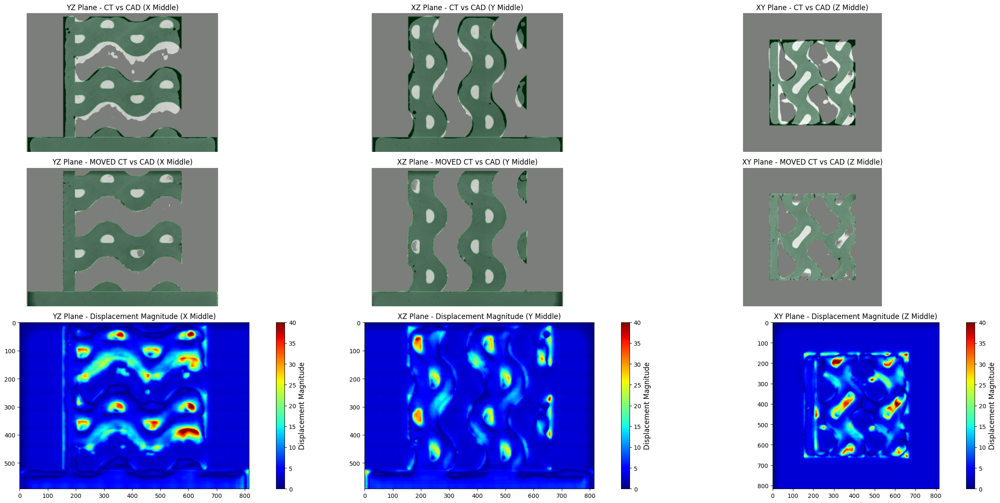

In [5]:
generate_plots_magnitude(moving_image, fixed_image, reconstructed_moved, reconstructed_displacement)

Predicting for sample: sample7
1/1 [==============================] - 0s 168ms/step
Time taken to test one sample: 6.92 minutes


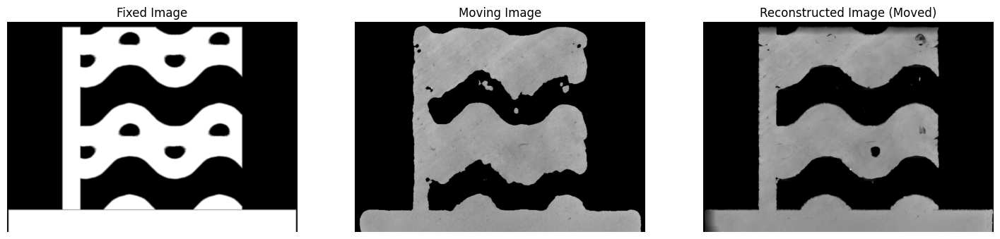

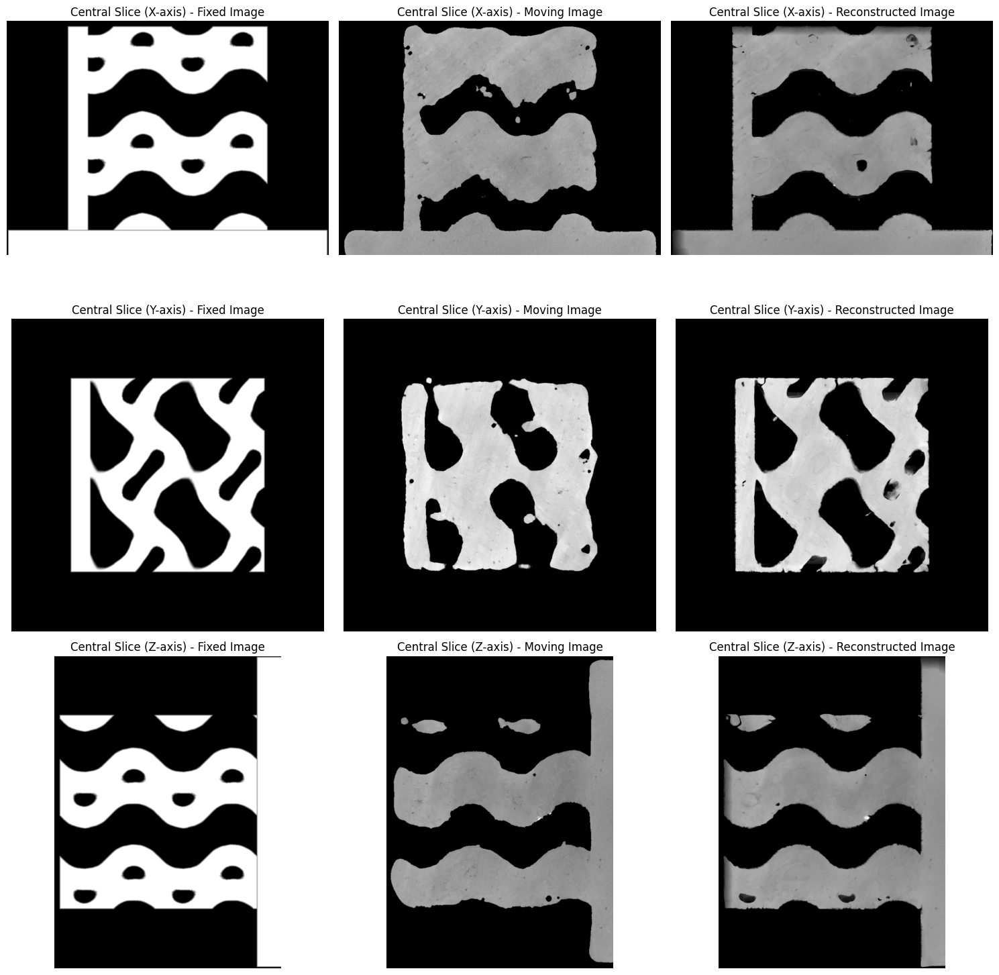

Dice score before non-linear registration on test data is: 0.8213
Dice score after non-linear registration on test data is: 0.9463


In [6]:
import os
import h5py
import numpy as np
import tensorflow as tf
import tifffile as tiff
import voxelmorph as vxm
import matplotlib.pyplot as plt
import pyvista as pv
import pandas as pd
import time
from skimage import filters

# Set GPU device
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
tf.get_logger().setLevel('ERROR')


def save_as_tiff(image, filename):
    """
    Function to save a 3D numpy array as a TIFF file.
    
    Args:
        image (numpy array): The 3D image to be saved.
        filename (str): The filename where the image will be saved.
    """
    tiff.imwrite(filename, image)

def save_image_as_vtk(moved_image, filename):
    # Create a PyVista grid for the moved image
    moved_image_shape = moved_image.shape
    x = np.arange(moved_image_shape[0])
    y = np.arange(moved_image_shape[1])
    z = np.arange(moved_image_shape[2])
    grid = pv.StructuredGrid(*np.meshgrid(x, y, z, indexing="ij"))

    # Add the moved image data to the grid
    grid["image"] = moved_image.flatten(order="F")  # Flatten in Fortran order

    # Save the moved image grid to a VTK file
    grid.save(filename)

# Function to save the displacement vector field as a VTK file
def save_displacement_vector_as_vtk(displacement_vector, filename):
    # Create a PyVista grid for the displacement vector
    vector_shape = displacement_vector.shape[:-1]
    x = np.arange(vector_shape[0])
    y = np.arange(vector_shape[1])
    z = np.arange(vector_shape[2])
    grid = pv.StructuredGrid(*np.meshgrid(x, y, z, indexing="ij"))

    # Add the displacement vector data to the grid
    vectors = np.zeros((np.prod(vector_shape), 3))
    for i in range(3):
        vectors[:, i] = displacement_vector[..., i].flatten(order="F")
    grid["displacement"] = vectors

    # Save the displacement vector grid to a VTK file
    grid.save(filename)

def get_middle_region(volume):
    """
    Extract the middle third region of the 3D volume to avoid outer areas with air.
    
    Args:
        volume (numpy array): The 3D volume.
        
    Returns:
        numpy array: The extracted middle region of the 3D volume.
    """
    # Define the start and end points for the middle third in each dimension
    start_x, end_x = volume.shape[0] // 3, 2 * volume.shape[0] // 3
    start_y, end_y = volume.shape[1] // 3, 2 * volume.shape[1] // 3
    start_z, end_z = volume.shape[2] // 3, 2 * volume.shape[2] // 3
    
    # Extract the middle region
    middle_region = volume[start_x:end_x, start_y:end_y, start_z:end_z]    
    return middle_region

def global_otsu_thresholding(data, roi=None):
    # Flatten the 3D CT data to a 1D array
    if roi is not None:
        # Apply the ROI to the data

        flattened_data = roi.flatten()
    else:
        # Flatten the entire data if ROI is not specified
        flattened_data = data.flatten()

    # Apply Otsu's thresholding to the flattened data
    threshold = filters.threshold_otsu(flattened_data)

    # Threshold the entire CT data
    thresholded_data = (data >= threshold).astype(np.uint8) * 1

    return thresholded_data

def dice_coefficient(volume_A, volume_B):

    # Get the middle third region of the volumes
    roi_A = get_middle_region(volume_A)
    roi_B = get_middle_region(volume_B)

    #binarize the volumes
    volume_A = global_otsu_thresholding(volume_A, roi=roi_A)
    volume_B = global_otsu_thresholding(volume_B, roi=roi_B)

    #make sure diemsion is same
    min_dim0 = min(volume_A.shape[0], volume_B.shape[0])
    min_dim1 = min(volume_A.shape[1], volume_B.shape[1])
    min_dim2 = min(volume_A.shape[2], volume_B.shape[2])

    volume_A = volume_A[:min_dim0, :min_dim1, :min_dim2]
    volume_B = volume_B[:min_dim0, :min_dim1, :min_dim2]

    #calculate the dice score
    volume_A = np.array(volume_A, dtype=np.float64)
    volume_B = np.array(volume_B, dtype=np.float64)
    intersection = np.sum(np.logical_and(volume_A, volume_B))
    total_voxels_A = np.sum(volume_A)
    total_voxels_B = np.sum(volume_B)
    dice = (2.0 * intersection) / (total_voxels_A + total_voxels_B)
    return dice

def plot_images(fixed_image, moving_image, reconstructed_image, slice_idx=None):
    """
    Function to plot the fixed image, moving image, and reconstructed image (moved image)
    after testing on a single slice.
    
    Args:
        fixed_image (numpy array): The fixed image volume.
        moving_image (numpy array): The moving image volume.
        reconstructed_image (numpy array): The reconstructed image volume (moved image).
        slice_idx (int, optional): The index of the slice to visualize. If None, the middle slice is used.
    """
    # If no slice index is provided, use the middle slice
    if slice_idx is None:
        slice_idx = fixed_image.shape[0] // 2  # Middle slice of the 3D volume

    # Plotting
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot fixed image
    axes[0].imshow(fixed_image[slice_idx, :, :], cmap='gray')
    axes[0].set_title("Fixed Image")
    axes[0].axis('off')

    # Plot moving image
    axes[1].imshow(moving_image[slice_idx, :, :], cmap='gray')
    axes[1].set_title("Moving Image")
    axes[1].axis('off')

    # Plot reconstructed (moved) image
    axes[2].imshow(reconstructed_image[slice_idx, :, :], cmap='gray')
    axes[2].set_title("Reconstructed Image (Moved)")
    axes[2].axis('off')

    plt.show()



def plot_3x3_images(fixed_image, moving_image, reconstructed_image):
    """
    Function to plot a 3x3 grid for fixed, moving, and moved images.
    The central slices from the x, y, and z axes are visualized.
    
    Args:
        fixed_image (numpy array): The fixed image volume.
        moving_image (numpy array): The moving image volume.
        reconstructed_image (numpy array): The reconstructed image volume (moved image).
    """
    # Calculate central indices for each axis
    center_x = fixed_image.shape[0] // 2
    center_y = fixed_image.shape[1] // 2
    center_z = fixed_image.shape[2] // 2

    # Prepare slices from x, y, and z axes
    fixed_slices = [fixed_image[center_x, :, :], fixed_image[:, center_y, :], fixed_image[:, :, center_z]]
    moving_slices = [moving_image[center_x, :, :], moving_image[:, center_y, :], moving_image[:, :, center_z]]
    reconstructed_slices = [reconstructed_image[center_x, :, :], reconstructed_image[:, center_y, :], reconstructed_image[:, :, center_z]]

    # Titles for subplots
    row_titles = ["Central Slice (X-axis)", "Central Slice (Y-axis)", "Central Slice (Z-axis)"]
    column_titles = ["Fixed Image", "Moving Image", "Reconstructed Image"]

    # Plotting
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))

    for i in range(3):  # For each axis
        # Plot fixed, moving, and reconstructed images for each axis
        axes[i, 0].imshow(fixed_slices[i], cmap='gray')
        axes[i, 0].set_title(f"{row_titles[i]} - {column_titles[0]}")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(moving_slices[i], cmap='gray')
        axes[i, 1].set_title(f"{row_titles[i]} - {column_titles[1]}")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(reconstructed_slices[i], cmap='gray')
        axes[i, 2].set_title(f"{row_titles[i]} - {column_titles[2]}")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

import numpy as np
import h5py
import time

def gaussian_weight(shape, sigma=0.5):
    """Generate a Gaussian weighting function to reduce block artifacts."""
    z, y, x = np.meshgrid(
        np.linspace(-1, 1, shape[0]), 
        np.linspace(-1, 1, shape[1]), 
        np.linspace(-1, 1, shape[2]), indexing='ij')
    weight = np.exp(-(x**2 + y**2 + z**2) / (2 * sigma**2))
    return weight / np.max(weight)  # Normalize to max 1

def test_data_generator(hdf5_file, patch_size=(128, 128, 128), stride=(50, 50, 50)):
    """
    Generator that extracts consecutive patches from a 3D volume, processes them, 
    and then stitches them back together for one sample.

    Args:
        hdf5_file: Path to the HDF5 file containing the volume data.
        patch_size: Size of the 3D patches to extract.
        stride: The step size between consecutive patches.
    
    Yields:
        A tuple of stitched volumes (moved image, displacement field) reconstructed from the processed patches.
    """
    hf = h5py.File(hdf5_file, 'r')
    num_samples = len(hf.keys()) // 2  # Assuming paired 'static' and 'moving' datasets
    
    for idx in range(num_samples):
        start_time = time.time()
        sample_name = hf[f'static_{idx}'].attrs.get('sample_name', f'sample_{idx}')
        print(f'Predicting for sample: {sample_name}')
        
        vol_shape = hf[f'static_{idx}'].shape
        moving_image = hf[f'moving_{idx}'][...]
        fixed_image = hf[f'static_{idx}'][...]
        
        # Calculate padding
        pad_fixed = [(0, (patch_size[i] - (vol_shape[i] % patch_size[i])) % patch_size[i]) for i in range(3)]
        pad_moving = [(0, (patch_size[i] - (vol_shape[i] % patch_size[i])) % patch_size[i]) for i in range(3)]

        # Apply padding
        padded_moving = np.pad(moving_image, pad_moving, mode='reflect')
        padded_fixed = np.pad(fixed_image, pad_fixed, mode='reflect')
        padded_vol_shape = padded_fixed.shape

        # Compute the number of patches per dimension
        patches_per_dim = [(padded_vol_shape[i] - patch_size[i]) // stride[i] + 1 for i in range(3)]

        # Initialize arrays for stitching
        reconstructed_moved = np.zeros(padded_vol_shape)
        reconstructed_displacement = np.zeros((*padded_vol_shape, 3))
        weight_volume = np.zeros(padded_vol_shape)

        # Precompute Gaussian weights for blending
        gaussian_weights = gaussian_weight(patch_size)

        for z in range(patches_per_dim[0]):
            for y in range(patches_per_dim[1]):
                for x in range(patches_per_dim[2]):
                    start_z, start_y, start_x = z * stride[0], y * stride[1], x * stride[2]

                    # Extract patch
                    moving_patch = padded_moving[start_z:start_z + patch_size[0],
                                                 start_y:start_y + patch_size[1],
                                                 start_x:start_x + patch_size[2]]

                    # Prepare model input
                    patch_input = np.expand_dims(moving_patch, axis=-1)
                    fixed_patch = padded_fixed[start_z:start_z + patch_size[0],
                                               start_y:start_y + patch_size[1],
                                               start_x:start_x + patch_size[2]]
                    fixed_patch = np.expand_dims(fixed_patch, axis=-1)
                    inputs = [np.expand_dims(patch_input, axis=0), np.expand_dims(fixed_patch, axis=0)]

                    # Model prediction
                    processed_patch, displacement_patch = vxm_model.predict(inputs)
                    processed_patch = processed_patch.squeeze()
                    displacement_patch = displacement_patch.squeeze()

                    # Stitch with Gaussian blending
                    reconstructed_moved[start_z:start_z + patch_size[0],
                                        start_y:start_y + patch_size[1],
                                        start_x:start_x + patch_size[2]] += processed_patch * gaussian_weights

                    reconstructed_displacement[start_z:start_z + patch_size[0],
                                               start_y:start_y + patch_size[1],
                                               start_x:start_x + patch_size[2], :] += displacement_patch * gaussian_weights[..., np.newaxis]

                    weight_volume[start_z:start_z + patch_size[0],
                                  start_y:start_y + patch_size[1],
                                  start_x:start_x + patch_size[2]] += gaussian_weights

        # Normalize stitched volumes to remove overlapping artifacts
        reconstructed_moved /= np.maximum(weight_volume, 1)
        reconstructed_displacement /= np.maximum(weight_volume[..., np.newaxis], 1)

        # Crop padded area to restore original volume size
        reconstructed_moved = reconstructed_moved[:vol_shape[0], :vol_shape[1], :vol_shape[2]]
        reconstructed_displacement = reconstructed_displacement[:vol_shape[0], :vol_shape[1], :vol_shape[2], :]

        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60
        print(f"Time taken to test one sample: {elapsed_time:.2f} minutes")

        yield reconstructed_moved, reconstructed_displacement, fixed_image, moving_image


# Load trained VoxelMorph model
model_path = "/home/kchand/results/vxm_model_weights.h5"
architecture_path = "/home/kchand/results/vxm_model_architecture.json"


# Load model architecture
with open(architecture_path, "r") as json_file:
    model_json = json_file.read()
vxm_model = tf.keras.models.model_from_json(model_json, 
                custom_objects={'SpatialTransformer': vxm.layers.SpatialTransformer, 
                'VxmDense': vxm.networks.VxmDense})

# Load model weights
vxm_model.load_weights(model_path)

#
# test data load
test_hdf5 = r'/home/kchand/input_data/test_data.h5'


# Initialize the test generator
test_generator = test_data_generator(test_hdf5, patch_size=(128, 128, 128), stride=(64, 64, 64))
# Get the output for just one sample
reconstructed_moved, reconstructed_displacement, fixed_image, moving_image = next(test_generator)
# Plot the images
plot_images(fixed_image, moving_image, reconstructed_moved)
plot_3x3_images(fixed_image, moving_image, reconstructed_moved)
# calculate Dice score on the data before and aftr non linear reg excluding the base plate
Dice_init = dice_coefficient(fixed_image[:,:530,:], moving_image[:,:530,:])
print(f'Dice score before non-linear registration on test data is: {Dice_init:.4f}')
Dice_after_reg = dice_coefficient(fixed_image[:,:530,:], reconstructed_moved[:,:530,:])
print(f'Dice score after non-linear registration on test data is: {Dice_after_reg:.4f}')





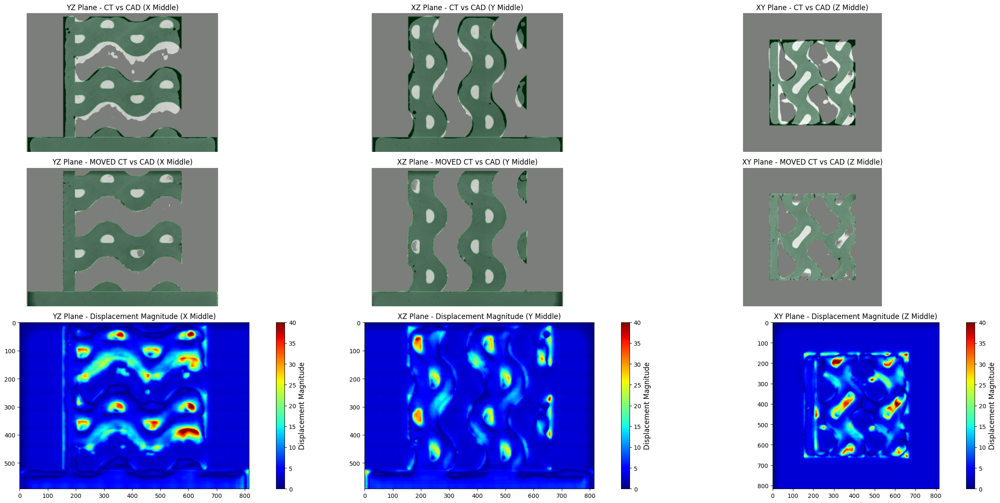

In [7]:
generate_plots_magnitude(moving_image, fixed_image, reconstructed_moved, reconstructed_displacement)

In [8]:
import os
import h5py
import numpy as np
import tensorflow as tf
import tifffile as tiff
import voxelmorph as vxm
import matplotlib.pyplot as plt
import pyvista as pv
import pandas as pd
import time
from skimage import filters

# Set GPU device
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
tf.get_logger().setLevel('ERROR')


def save_as_tiff(image, filename):
    """
    Function to save a 3D numpy array as a TIFF file.
    
    Args:
        image (numpy array): The 3D image to be saved.
        filename (str): The filename where the image will be saved.
    """
    tiff.imwrite(filename, image)

def save_image_as_vtk(moved_image, filename):
    # Create a PyVista grid for the moved image
    moved_image_shape = moved_image.shape
    x = np.arange(moved_image_shape[0])
    y = np.arange(moved_image_shape[1])
    z = np.arange(moved_image_shape[2])
    grid = pv.StructuredGrid(*np.meshgrid(x, y, z, indexing="ij"))

    # Add the moved image data to the grid
    grid["image"] = moved_image.flatten(order="F")  # Flatten in Fortran order

    # Save the moved image grid to a VTK file
    grid.save(filename)

# Function to save the displacement vector field as a VTK file
def save_displacement_vector_as_vtk(displacement_vector, filename):
    # Create a PyVista grid for the displacement vector
    vector_shape = displacement_vector.shape[:-1]
    x = np.arange(vector_shape[0])
    y = np.arange(vector_shape[1])
    z = np.arange(vector_shape[2])
    grid = pv.StructuredGrid(*np.meshgrid(x, y, z, indexing="ij"))

    # Add the displacement vector data to the grid
    vectors = np.zeros((np.prod(vector_shape), 3))
    for i in range(3):
        vectors[:, i] = displacement_vector[..., i].flatten(order="F")
    grid["displacement"] = vectors

    # Save the displacement vector grid to a VTK file
    grid.save(filename)

def get_middle_region(volume):
    """
    Extract the middle third region of the 3D volume to avoid outer areas with air.
    
    Args:
        volume (numpy array): The 3D volume.
        
    Returns:
        numpy array: The extracted middle region of the 3D volume.
    """
    # Define the start and end points for the middle third in each dimension
    start_x, end_x = volume.shape[0] // 3, 2 * volume.shape[0] // 3
    start_y, end_y = volume.shape[1] // 3, 2 * volume.shape[1] // 3
    start_z, end_z = volume.shape[2] // 3, 2 * volume.shape[2] // 3
    
    # Extract the middle region
    middle_region = volume[start_x:end_x, start_y:end_y, start_z:end_z]    
    return middle_region

def global_otsu_thresholding(data, roi=None):
    # Flatten the 3D CT data to a 1D array
    if roi is not None:
        # Apply the ROI to the data

        flattened_data = roi.flatten()
    else:
        # Flatten the entire data if ROI is not specified
        flattened_data = data.flatten()

    # Apply Otsu's thresholding to the flattened data
    threshold = filters.threshold_otsu(flattened_data)

    # Threshold the entire CT data
    thresholded_data = (data >= threshold).astype(np.uint8) * 1

    return thresholded_data

def dice_coefficient(volume_A, volume_B):

    # Get the middle third region of the volumes
    roi_A = get_middle_region(volume_A)
    roi_B = get_middle_region(volume_B)

    #binarize the volumes
    volume_A = global_otsu_thresholding(volume_A, roi=roi_A)
    volume_B = global_otsu_thresholding(volume_B, roi=roi_B)

    #make sure diemsion is same
    min_dim0 = min(volume_A.shape[0], volume_B.shape[0])
    min_dim1 = min(volume_A.shape[1], volume_B.shape[1])
    min_dim2 = min(volume_A.shape[2], volume_B.shape[2])

    volume_A = volume_A[:min_dim0, :min_dim1, :min_dim2]
    volume_B = volume_B[:min_dim0, :min_dim1, :min_dim2]

    #calculate the dice score
    volume_A = np.array(volume_A, dtype=np.float64)
    volume_B = np.array(volume_B, dtype=np.float64)
    intersection = np.sum(np.logical_and(volume_A, volume_B))
    total_voxels_A = np.sum(volume_A)
    total_voxels_B = np.sum(volume_B)
    dice = (2.0 * intersection) / (total_voxels_A + total_voxels_B)
    return dice

def plot_images(fixed_image, moving_image, reconstructed_image, slice_idx=None):
    """
    Function to plot the fixed image, moving image, and reconstructed image (moved image)
    after testing on a single slice.
    
    Args:
        fixed_image (numpy array): The fixed image volume.
        moving_image (numpy array): The moving image volume.
        reconstructed_image (numpy array): The reconstructed image volume (moved image).
        slice_idx (int, optional): The index of the slice to visualize. If None, the middle slice is used.
    """
    # If no slice index is provided, use the middle slice
    if slice_idx is None:
        slice_idx = fixed_image.shape[0] // 2  # Middle slice of the 3D volume

    # Plotting
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot fixed image
    axes[0].imshow(fixed_image[slice_idx, :, :], cmap='gray')
    axes[0].set_title("Fixed Image")
    axes[0].axis('off')

    # Plot moving image
    axes[1].imshow(moving_image[slice_idx, :, :], cmap='gray')
    axes[1].set_title("Moving Image")
    axes[1].axis('off')

    # Plot reconstructed (moved) image
    axes[2].imshow(reconstructed_image[slice_idx, :, :], cmap='gray')
    axes[2].set_title("Reconstructed Image (Moved)")
    axes[2].axis('off')

    plt.show()



def plot_3x3_images(fixed_image, moving_image, reconstructed_image):
    """
    Function to plot a 3x3 grid for fixed, moving, and moved images.
    The central slices from the x, y, and z axes are visualized.
    
    Args:
        fixed_image (numpy array): The fixed image volume.
        moving_image (numpy array): The moving image volume.
        reconstructed_image (numpy array): The reconstructed image volume (moved image).
    """
    # Calculate central indices for each axis
    center_x = fixed_image.shape[0] // 2
    center_y = fixed_image.shape[1] // 2
    center_z = fixed_image.shape[2] // 2

    # Prepare slices from x, y, and z axes
    fixed_slices = [fixed_image[center_x, :, :], fixed_image[:, center_y, :], fixed_image[:, :, center_z]]
    moving_slices = [moving_image[center_x, :, :], moving_image[:, center_y, :], moving_image[:, :, center_z]]
    reconstructed_slices = [reconstructed_image[center_x, :, :], reconstructed_image[:, center_y, :], reconstructed_image[:, :, center_z]]

    # Titles for subplots
    row_titles = ["Central Slice (X-axis)", "Central Slice (Y-axis)", "Central Slice (Z-axis)"]
    column_titles = ["Fixed Image", "Moving Image", "Reconstructed Image"]

    # Plotting
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))

    for i in range(3):  # For each axis
        # Plot fixed, moving, and reconstructed images for each axis
        axes[i, 0].imshow(fixed_slices[i], cmap='gray')
        axes[i, 0].set_title(f"{row_titles[i]} - {column_titles[0]}")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(moving_slices[i], cmap='gray')
        axes[i, 1].set_title(f"{row_titles[i]} - {column_titles[1]}")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(reconstructed_slices[i], cmap='gray')
        axes[i, 2].set_title(f"{row_titles[i]} - {column_titles[2]}")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

def gaussian_weight(shape, sigma=0.7):
    """Generate a Gaussian weighting function to reduce block artifacts."""
    z, y, x = np.meshgrid(
        np.linspace(-1, 1, shape[0]), 
        np.linspace(-1, 1, shape[1]), 
        np.linspace(-1, 1, shape[2]), indexing='ij')
    weight = np.exp(-(x**2 + y**2 + z**2) / (2 * sigma**2))
    return weight / np.max(weight)  # Normalize to max 1

def test_data_generator(hdf5_file, patch_size=(128, 128, 128), stride=(64, 64, 64)):
    """
    Generator that extracts consecutive patches from a 3D volume, processes them, 
    and then stitches them back together for one sample.

    Args:
        hdf5_file: Path to the HDF5 file containing the volume data.
        patch_size: Size of the 3D patches to extract.
        stride: The step size between consecutive patches.
    
    Yields:
        A tuple of stitched volumes (moved image, displacement field) reconstructed from the processed patches.
    """
    hf = h5py.File(hdf5_file, 'r')
    num_samples = len(hf.keys()) // 2  # Assuming paired 'static' and 'moving' datasets
    
    # Calculate the necessary padding for each dimension
    #pad = [(0, (patch_size[i] - (vol_shape[i] % patch_size[i])) % patch_size[i]) for i in range(len(vol_shape))]
    for idx in range(num_samples):
        start_time = time.time()
        sample_name = hf[f'static_{idx}'].attrs.get('sample_name', f'sample_{idx}')
        print(f'Predicting for sample: {sample_name}')

        vol_shape = hf[f'static_{idx}'].shape
        moving_image = hf[f'moving_{idx}'][...]
        fixed_image = hf[f'static_{idx}'][...]


        moving_shape = moving_image.shape
        fixed_shape = fixed_image.shape
        pad_fixed = [(0, (patch_size[i] - (fixed_shape[i] % patch_size[i])) % patch_size[i]) for i in range(len(fixed_shape))]
        pad_moving = [(0, (patch_size[i] - (moving_shape[i] % patch_size[i])) % patch_size[i]) for i in range(len(moving_shape))]

        # Apply padding to the images
        padded_moving = np.pad(moving_image, pad_moving, mode='reflect')
        padded_fixed = np.pad(fixed_image, pad_fixed, mode='reflect')
        padded_vol_shape = padded_fixed.shape
        print('Padded data with zeros')

        # Calculate the number of patches in each dimension
        patches_per_dim = [(padded_vol_shape[i] - patch_size[i]) // stride[i] + 1 for i in range(len(padded_vol_shape))]

        # Initialize empty arrays for the stitched moved image and displacement field
        reconstructed_moved = np.zeros(padded_vol_shape)
        reconstructed_displacement = np.zeros((*padded_vol_shape, 3))
        weight_volume = np.zeros(padded_vol_shape)  # To handle overlapping regions

        # Precompute Gaussian weights for blending
        gaussian_weights = gaussian_weight(patch_size)

        print('Initialized arrays')
        for z in range(patches_per_dim[0]):
            for y in range(patches_per_dim[1]):
                for x in range(patches_per_dim[2]):
                    start_z = z * stride[0]
                    start_y = y * stride[1]
                    start_x = x * stride[2]
                    print('Extracting Patch :::>')
                    # Extract patch
                    moving_patch = padded_moving[start_z:start_z + patch_size[0],
                                                 start_y:start_y + patch_size[1],
                                                 start_x:start_x + patch_size[2]]

                    # Normalize the patch
                    #moving_patch = (moving_patch - np.min(moving_patch)) / (np.max(moving_patch) - np.min(moving_patch))

                    # Prepare input for the model
                    patch_input = np.expand_dims(moving_patch, axis=-1)  # Add channel dimension
                    fixed_patch = padded_fixed[start_z:start_z + patch_size[0],
                                               start_y:start_y + patch_size[1],
                                               start_x:start_x + patch_size[2]]
                    fixed_patch = np.expand_dims(fixed_patch, axis=-1)
                    inputs = [np.expand_dims(patch_input, axis=0), np.expand_dims(fixed_patch, axis=0)]
                    
                    # Model prediction
                    print('Model prediction :::>')
                    processed_patch, displacement_patch = vxm_model.predict(inputs)
                    processed_patch = processed_patch.squeeze()
                    displacement_patch = displacement_patch.squeeze()

                    # Stitch with Gaussian blending
                    reconstructed_moved[start_z:start_z + patch_size[0],
                                        start_y:start_y + patch_size[1],
                                        start_x:start_x + patch_size[2]] += processed_patch * gaussian_weights

                    reconstructed_displacement[start_z:start_z + patch_size[0],
                                               start_y:start_y + patch_size[1],
                                               start_x:start_x + patch_size[2], :] += displacement_patch * gaussian_weights[..., np.newaxis]

                    weight_volume[start_z:start_z + patch_size[0],
                                  start_y:start_y + patch_size[1],
                                  start_x:start_x + patch_size[2]] += gaussian_weights

                    print('Stitching prediction :::>')
                    

        # Normalize to handle overlapping regions
        reconstructed_moved /= np.maximum(weight_volume, 1)  # Avoid division by zero
        reconstructed_displacement /= np.maximum(weight_volume[..., np.newaxis], 1)  # Normalize the vector field
        print('Crop padded area :::>')
        # Crop the padded area out to restore the original volume shape
        reconstructed_moved = reconstructed_moved[:vol_shape[0], :vol_shape[1], :vol_shape[2]]
        reconstructed_displacement = reconstructed_displacement[:vol_shape[0], :vol_shape[1], :vol_shape[2], :]
        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60
        print(f"Time taken to test one sample: {elapsed_time:.2f} minutes")
        yield reconstructed_moved, reconstructed_displacement, fixed_image, moving_image  # Yield the reconstructed volumes and fixed image



# Load trained VoxelMorph model
model_path = "/home/kchand/results/vxm_model_weights.h5"
architecture_path = "/home/kchand/results/vxm_model_architecture.json"


# Load model architecture
with open(architecture_path, "r") as json_file:
    model_json = json_file.read()
vxm_model = tf.keras.models.model_from_json(model_json, 
                custom_objects={'SpatialTransformer': vxm.layers.SpatialTransformer, 
                'VxmDense': vxm.networks.VxmDense})

# Load model weights
vxm_model.load_weights(model_path)

#
# test data load
test_hdf5 = r'/home/kchand/input_data/test_data.h5'


# Initialize the test generator
test_generator = test_data_generator(test_hdf5, patch_size=(128, 128, 128), stride=(64, 64, 64))



In [9]:
# Get the output for just one sample
reconstructed_moved, reconstructed_displacement, fixed_image, moving_image = next(test_generator)

Predicting for sample: sample7
Padded data with zeros
Initialized arrays
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 465ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 174ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 180ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 174ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 170ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 166ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 177ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [=================

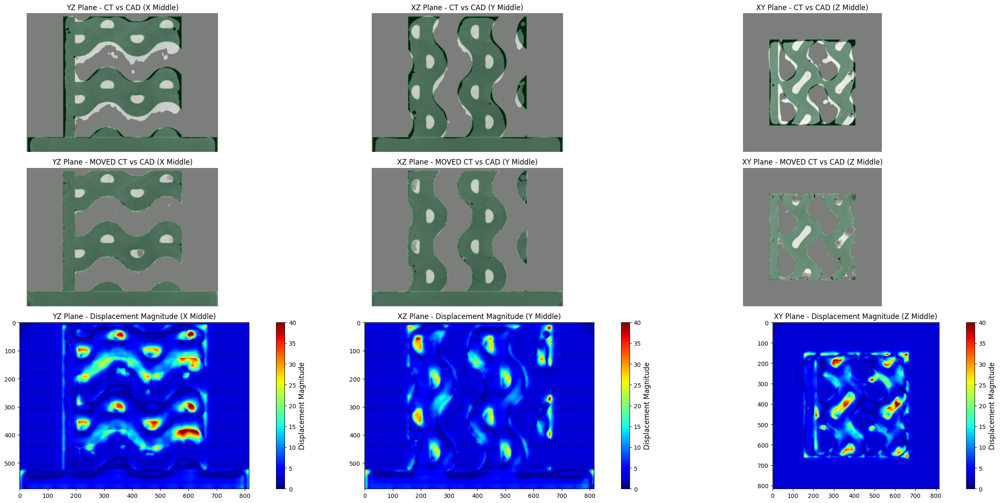

In [10]:
generate_plots_magnitude(moving_image, fixed_image, reconstructed_moved, reconstructed_displacement)

In [11]:
import os
import h5py
import numpy as np
import tensorflow as tf
import tifffile as tiff
import voxelmorph as vxm
import matplotlib.pyplot as plt
import pyvista as pv
import pandas as pd
import time
from skimage import filters

# Set GPU device
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
tf.get_logger().setLevel('ERROR')


def save_as_tiff(image, filename):
    """
    Function to save a 3D numpy array as a TIFF file.
    
    Args:
        image (numpy array): The 3D image to be saved.
        filename (str): The filename where the image will be saved.
    """
    tiff.imwrite(filename, image)

def save_image_as_vtk(moved_image, filename):
    # Create a PyVista grid for the moved image
    moved_image_shape = moved_image.shape
    x = np.arange(moved_image_shape[0])
    y = np.arange(moved_image_shape[1])
    z = np.arange(moved_image_shape[2])
    grid = pv.StructuredGrid(*np.meshgrid(x, y, z, indexing="ij"))

    # Add the moved image data to the grid
    grid["image"] = moved_image.flatten(order="F")  # Flatten in Fortran order

    # Save the moved image grid to a VTK file
    grid.save(filename)

# Function to save the displacement vector field as a VTK file
def save_displacement_vector_as_vtk(displacement_vector, filename):
    # Create a PyVista grid for the displacement vector
    vector_shape = displacement_vector.shape[:-1]
    x = np.arange(vector_shape[0])
    y = np.arange(vector_shape[1])
    z = np.arange(vector_shape[2])
    grid = pv.StructuredGrid(*np.meshgrid(x, y, z, indexing="ij"))

    # Add the displacement vector data to the grid
    vectors = np.zeros((np.prod(vector_shape), 3))
    for i in range(3):
        vectors[:, i] = displacement_vector[..., i].flatten(order="F")
    grid["displacement"] = vectors

    # Save the displacement vector grid to a VTK file
    grid.save(filename)

def get_middle_region(volume):
    """
    Extract the middle third region of the 3D volume to avoid outer areas with air.
    
    Args:
        volume (numpy array): The 3D volume.
        
    Returns:
        numpy array: The extracted middle region of the 3D volume.
    """
    # Define the start and end points for the middle third in each dimension
    start_x, end_x = volume.shape[0] // 3, 2 * volume.shape[0] // 3
    start_y, end_y = volume.shape[1] // 3, 2 * volume.shape[1] // 3
    start_z, end_z = volume.shape[2] // 3, 2 * volume.shape[2] // 3
    
    # Extract the middle region
    middle_region = volume[start_x:end_x, start_y:end_y, start_z:end_z]    
    return middle_region

def global_otsu_thresholding(data, roi=None):
    # Flatten the 3D CT data to a 1D array
    if roi is not None:
        # Apply the ROI to the data

        flattened_data = roi.flatten()
    else:
        # Flatten the entire data if ROI is not specified
        flattened_data = data.flatten()

    # Apply Otsu's thresholding to the flattened data
    threshold = filters.threshold_otsu(flattened_data)

    # Threshold the entire CT data
    thresholded_data = (data >= threshold).astype(np.uint8) * 1

    return thresholded_data

def dice_coefficient(volume_A, volume_B):

    # Get the middle third region of the volumes
    roi_A = get_middle_region(volume_A)
    roi_B = get_middle_region(volume_B)

    #binarize the volumes
    volume_A = global_otsu_thresholding(volume_A, roi=roi_A)
    volume_B = global_otsu_thresholding(volume_B, roi=roi_B)

    #make sure diemsion is same
    min_dim0 = min(volume_A.shape[0], volume_B.shape[0])
    min_dim1 = min(volume_A.shape[1], volume_B.shape[1])
    min_dim2 = min(volume_A.shape[2], volume_B.shape[2])

    volume_A = volume_A[:min_dim0, :min_dim1, :min_dim2]
    volume_B = volume_B[:min_dim0, :min_dim1, :min_dim2]

    #calculate the dice score
    volume_A = np.array(volume_A, dtype=np.float64)
    volume_B = np.array(volume_B, dtype=np.float64)
    intersection = np.sum(np.logical_and(volume_A, volume_B))
    total_voxels_A = np.sum(volume_A)
    total_voxels_B = np.sum(volume_B)
    dice = (2.0 * intersection) / (total_voxels_A + total_voxels_B)
    return dice

def plot_images(fixed_image, moving_image, reconstructed_image, slice_idx=None):
    """
    Function to plot the fixed image, moving image, and reconstructed image (moved image)
    after testing on a single slice.
    
    Args:
        fixed_image (numpy array): The fixed image volume.
        moving_image (numpy array): The moving image volume.
        reconstructed_image (numpy array): The reconstructed image volume (moved image).
        slice_idx (int, optional): The index of the slice to visualize. If None, the middle slice is used.
    """
    # If no slice index is provided, use the middle slice
    if slice_idx is None:
        slice_idx = fixed_image.shape[0] // 2  # Middle slice of the 3D volume

    # Plotting
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot fixed image
    axes[0].imshow(fixed_image[slice_idx, :, :], cmap='gray')
    axes[0].set_title("Fixed Image")
    axes[0].axis('off')

    # Plot moving image
    axes[1].imshow(moving_image[slice_idx, :, :], cmap='gray')
    axes[1].set_title("Moving Image")
    axes[1].axis('off')

    # Plot reconstructed (moved) image
    axes[2].imshow(reconstructed_image[slice_idx, :, :], cmap='gray')
    axes[2].set_title("Reconstructed Image (Moved)")
    axes[2].axis('off')

    plt.show()



def plot_3x3_images(fixed_image, moving_image, reconstructed_image):
    """
    Function to plot a 3x3 grid for fixed, moving, and moved images.
    The central slices from the x, y, and z axes are visualized.
    
    Args:
        fixed_image (numpy array): The fixed image volume.
        moving_image (numpy array): The moving image volume.
        reconstructed_image (numpy array): The reconstructed image volume (moved image).
    """
    # Calculate central indices for each axis
    center_x = fixed_image.shape[0] // 2
    center_y = fixed_image.shape[1] // 2
    center_z = fixed_image.shape[2] // 2

    # Prepare slices from x, y, and z axes
    fixed_slices = [fixed_image[center_x, :, :], fixed_image[:, center_y, :], fixed_image[:, :, center_z]]
    moving_slices = [moving_image[center_x, :, :], moving_image[:, center_y, :], moving_image[:, :, center_z]]
    reconstructed_slices = [reconstructed_image[center_x, :, :], reconstructed_image[:, center_y, :], reconstructed_image[:, :, center_z]]

    # Titles for subplots
    row_titles = ["Central Slice (X-axis)", "Central Slice (Y-axis)", "Central Slice (Z-axis)"]
    column_titles = ["Fixed Image", "Moving Image", "Reconstructed Image"]

    # Plotting
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))

    for i in range(3):  # For each axis
        # Plot fixed, moving, and reconstructed images for each axis
        axes[i, 0].imshow(fixed_slices[i], cmap='gray')
        axes[i, 0].set_title(f"{row_titles[i]} - {column_titles[0]}")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(moving_slices[i], cmap='gray')
        axes[i, 1].set_title(f"{row_titles[i]} - {column_titles[1]}")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(reconstructed_slices[i], cmap='gray')
        axes[i, 2].set_title(f"{row_titles[i]} - {column_titles[2]}")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

def gaussian_weight(shape, sigma=0.4):
    """Generate a Gaussian weighting function to reduce block artifacts."""
    z, y, x = np.meshgrid(
        np.linspace(-1, 1, shape[0]), 
        np.linspace(-1, 1, shape[1]), 
        np.linspace(-1, 1, shape[2]), indexing='ij')
    weight = np.exp(-(x**2 + y**2 + z**2) / (2 * sigma**2))
    return weight / np.max(weight)  # Normalize to max 1

def test_data_generator(hdf5_file, patch_size=(128, 128, 128), stride=(64, 64, 64)):
    """
    Generator that extracts consecutive patches from a 3D volume, processes them, 
    and then stitches them back together for one sample.

    Args:
        hdf5_file: Path to the HDF5 file containing the volume data.
        patch_size: Size of the 3D patches to extract.
        stride: The step size between consecutive patches.
    
    Yields:
        A tuple of stitched volumes (moved image, displacement field) reconstructed from the processed patches.
    """
    hf = h5py.File(hdf5_file, 'r')
    num_samples = len(hf.keys()) // 2  # Assuming paired 'static' and 'moving' datasets
    
    # Calculate the necessary padding for each dimension
    #pad = [(0, (patch_size[i] - (vol_shape[i] % patch_size[i])) % patch_size[i]) for i in range(len(vol_shape))]
    for idx in range(num_samples):
        start_time = time.time()
        sample_name = hf[f'static_{idx}'].attrs.get('sample_name', f'sample_{idx}')
        print(f'Predicting for sample: {sample_name}')

        vol_shape = hf[f'static_{idx}'].shape
        moving_image = hf[f'moving_{idx}'][...]
        fixed_image = hf[f'static_{idx}'][...]


        moving_shape = moving_image.shape
        fixed_shape = fixed_image.shape
        pad_fixed = [(0, (patch_size[i] - (fixed_shape[i] % patch_size[i])) % patch_size[i]) for i in range(len(fixed_shape))]
        pad_moving = [(0, (patch_size[i] - (moving_shape[i] % patch_size[i])) % patch_size[i]) for i in range(len(moving_shape))]

        # Apply padding to the images
        padded_moving = np.pad(moving_image, pad_moving, mode='reflect')
        padded_fixed = np.pad(fixed_image, pad_fixed, mode='reflect')
        padded_vol_shape = padded_fixed.shape
        print('Padded data with zeros')

        # Calculate the number of patches in each dimension
        patches_per_dim = [(padded_vol_shape[i] - patch_size[i]) // stride[i] + 1 for i in range(len(padded_vol_shape))]

        # Initialize empty arrays for the stitched moved image and displacement field
        reconstructed_moved = np.zeros(padded_vol_shape)
        reconstructed_displacement = np.zeros((*padded_vol_shape, 3))
        weight_volume = np.zeros(padded_vol_shape)  # To handle overlapping regions

        # Precompute Gaussian weights for blending
        gaussian_weights = gaussian_weight(patch_size)

        print('Initialized arrays')
        for z in range(patches_per_dim[0]):
            for y in range(patches_per_dim[1]):
                for x in range(patches_per_dim[2]):
                    start_z = z * stride[0]
                    start_y = y * stride[1]
                    start_x = x * stride[2]
                    print('Extracting Patch :::>')
                    # Extract patch
                    moving_patch = padded_moving[start_z:start_z + patch_size[0],
                                                 start_y:start_y + patch_size[1],
                                                 start_x:start_x + patch_size[2]]

                    # Normalize the patch
                    #moving_patch = (moving_patch - np.min(moving_patch)) / (np.max(moving_patch) - np.min(moving_patch))

                    # Prepare input for the model
                    patch_input = np.expand_dims(moving_patch, axis=-1)  # Add channel dimension
                    fixed_patch = padded_fixed[start_z:start_z + patch_size[0],
                                               start_y:start_y + patch_size[1],
                                               start_x:start_x + patch_size[2]]
                    fixed_patch = np.expand_dims(fixed_patch, axis=-1)
                    inputs = [np.expand_dims(patch_input, axis=0), np.expand_dims(fixed_patch, axis=0)]
                    
                    # Model prediction
                    print('Model prediction :::>')
                    processed_patch, displacement_patch = vxm_model.predict(inputs)
                    processed_patch = processed_patch.squeeze()
                    displacement_patch = displacement_patch.squeeze()

                    # Stitch with Gaussian blending
                    reconstructed_moved[start_z:start_z + patch_size[0],
                                        start_y:start_y + patch_size[1],
                                        start_x:start_x + patch_size[2]] += processed_patch * gaussian_weights

                    reconstructed_displacement[start_z:start_z + patch_size[0],
                                               start_y:start_y + patch_size[1],
                                               start_x:start_x + patch_size[2], :] += displacement_patch * gaussian_weights[..., np.newaxis]

                    weight_volume[start_z:start_z + patch_size[0],
                                  start_y:start_y + patch_size[1],
                                  start_x:start_x + patch_size[2]] += gaussian_weights

                    print('Stitching prediction :::>')
                    

        # Normalize to handle overlapping regions
        reconstructed_moved /= np.maximum(weight_volume, 1)  # Avoid division by zero
        reconstructed_displacement /= np.maximum(weight_volume[..., np.newaxis], 1)  # Normalize the vector field
        print('Crop padded area :::>')
        # Crop the padded area out to restore the original volume shape
        reconstructed_moved = reconstructed_moved[:vol_shape[0], :vol_shape[1], :vol_shape[2]]
        reconstructed_displacement = reconstructed_displacement[:vol_shape[0], :vol_shape[1], :vol_shape[2], :]
        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60
        print(f"Time taken to test one sample: {elapsed_time:.2f} minutes")
        yield reconstructed_moved, reconstructed_displacement, fixed_image, moving_image  # Yield the reconstructed volumes and fixed image



# Load trained VoxelMorph model
model_path = "/home/kchand/results/vxm_model_weights.h5"
architecture_path = "/home/kchand/results/vxm_model_architecture.json"


# Load model architecture
with open(architecture_path, "r") as json_file:
    model_json = json_file.read()
vxm_model = tf.keras.models.model_from_json(model_json, 
                custom_objects={'SpatialTransformer': vxm.layers.SpatialTransformer, 
                'VxmDense': vxm.networks.VxmDense})

# Load model weights
vxm_model.load_weights(model_path)

#
# test data load
test_hdf5 = r'/home/kchand/input_data/test_data.h5'


# Initialize the test generator
test_generator = test_data_generator(test_hdf5, patch_size=(128, 128, 128), stride=(64, 64, 64))



In [12]:
# Get the output for just one sample
reconstructed_moved, reconstructed_displacement, fixed_image, moving_image = next(test_generator)

Predicting for sample: sample7
Padded data with zeros
Initialized arrays
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 1s 586ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 321ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 205ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 165ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 159ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 176ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 158ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [=================

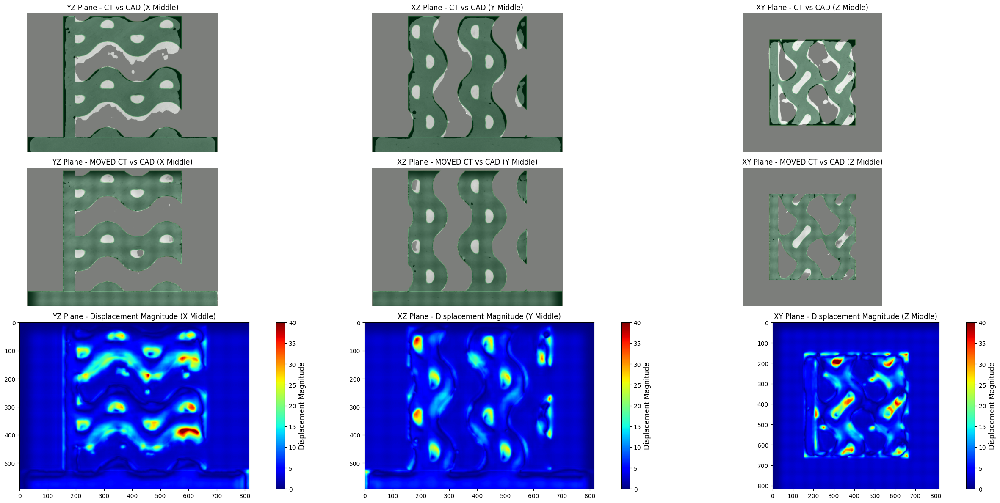

In [13]:
generate_plots_magnitude(moving_image, fixed_image, reconstructed_moved, reconstructed_displacement)

In [14]:
import os
import h5py
import numpy as np
import tensorflow as tf
import tifffile as tiff
import voxelmorph as vxm
import matplotlib.pyplot as plt
import pyvista as pv
import pandas as pd
import time
from skimage import filters

# Set GPU device
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
tf.get_logger().setLevel('ERROR')


def save_as_tiff(image, filename):
    """
    Function to save a 3D numpy array as a TIFF file.
    
    Args:
        image (numpy array): The 3D image to be saved.
        filename (str): The filename where the image will be saved.
    """
    tiff.imwrite(filename, image)

def save_image_as_vtk(moved_image, filename):
    # Create a PyVista grid for the moved image
    moved_image_shape = moved_image.shape
    x = np.arange(moved_image_shape[0])
    y = np.arange(moved_image_shape[1])
    z = np.arange(moved_image_shape[2])
    grid = pv.StructuredGrid(*np.meshgrid(x, y, z, indexing="ij"))

    # Add the moved image data to the grid
    grid["image"] = moved_image.flatten(order="F")  # Flatten in Fortran order

    # Save the moved image grid to a VTK file
    grid.save(filename)

# Function to save the displacement vector field as a VTK file
def save_displacement_vector_as_vtk(displacement_vector, filename):
    # Create a PyVista grid for the displacement vector
    vector_shape = displacement_vector.shape[:-1]
    x = np.arange(vector_shape[0])
    y = np.arange(vector_shape[1])
    z = np.arange(vector_shape[2])
    grid = pv.StructuredGrid(*np.meshgrid(x, y, z, indexing="ij"))

    # Add the displacement vector data to the grid
    vectors = np.zeros((np.prod(vector_shape), 3))
    for i in range(3):
        vectors[:, i] = displacement_vector[..., i].flatten(order="F")
    grid["displacement"] = vectors

    # Save the displacement vector grid to a VTK file
    grid.save(filename)

def get_middle_region(volume):
    """
    Extract the middle third region of the 3D volume to avoid outer areas with air.
    
    Args:
        volume (numpy array): The 3D volume.
        
    Returns:
        numpy array: The extracted middle region of the 3D volume.
    """
    # Define the start and end points for the middle third in each dimension
    start_x, end_x = volume.shape[0] // 3, 2 * volume.shape[0] // 3
    start_y, end_y = volume.shape[1] // 3, 2 * volume.shape[1] // 3
    start_z, end_z = volume.shape[2] // 3, 2 * volume.shape[2] // 3
    
    # Extract the middle region
    middle_region = volume[start_x:end_x, start_y:end_y, start_z:end_z]    
    return middle_region

def global_otsu_thresholding(data, roi=None):
    # Flatten the 3D CT data to a 1D array
    if roi is not None:
        # Apply the ROI to the data

        flattened_data = roi.flatten()
    else:
        # Flatten the entire data if ROI is not specified
        flattened_data = data.flatten()

    # Apply Otsu's thresholding to the flattened data
    threshold = filters.threshold_otsu(flattened_data)

    # Threshold the entire CT data
    thresholded_data = (data >= threshold).astype(np.uint8) * 1

    return thresholded_data

def dice_coefficient(volume_A, volume_B):

    # Get the middle third region of the volumes
    roi_A = get_middle_region(volume_A)
    roi_B = get_middle_region(volume_B)

    #binarize the volumes
    volume_A = global_otsu_thresholding(volume_A, roi=roi_A)
    volume_B = global_otsu_thresholding(volume_B, roi=roi_B)

    #make sure diemsion is same
    min_dim0 = min(volume_A.shape[0], volume_B.shape[0])
    min_dim1 = min(volume_A.shape[1], volume_B.shape[1])
    min_dim2 = min(volume_A.shape[2], volume_B.shape[2])

    volume_A = volume_A[:min_dim0, :min_dim1, :min_dim2]
    volume_B = volume_B[:min_dim0, :min_dim1, :min_dim2]

    #calculate the dice score
    volume_A = np.array(volume_A, dtype=np.float64)
    volume_B = np.array(volume_B, dtype=np.float64)
    intersection = np.sum(np.logical_and(volume_A, volume_B))
    total_voxels_A = np.sum(volume_A)
    total_voxels_B = np.sum(volume_B)
    dice = (2.0 * intersection) / (total_voxels_A + total_voxels_B)
    return dice

def plot_images(fixed_image, moving_image, reconstructed_image, slice_idx=None):
    """
    Function to plot the fixed image, moving image, and reconstructed image (moved image)
    after testing on a single slice.
    
    Args:
        fixed_image (numpy array): The fixed image volume.
        moving_image (numpy array): The moving image volume.
        reconstructed_image (numpy array): The reconstructed image volume (moved image).
        slice_idx (int, optional): The index of the slice to visualize. If None, the middle slice is used.
    """
    # If no slice index is provided, use the middle slice
    if slice_idx is None:
        slice_idx = fixed_image.shape[0] // 2  # Middle slice of the 3D volume

    # Plotting
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Plot fixed image
    axes[0].imshow(fixed_image[slice_idx, :, :], cmap='gray')
    axes[0].set_title("Fixed Image")
    axes[0].axis('off')

    # Plot moving image
    axes[1].imshow(moving_image[slice_idx, :, :], cmap='gray')
    axes[1].set_title("Moving Image")
    axes[1].axis('off')

    # Plot reconstructed (moved) image
    axes[2].imshow(reconstructed_image[slice_idx, :, :], cmap='gray')
    axes[2].set_title("Reconstructed Image (Moved)")
    axes[2].axis('off')

    plt.show()



def plot_3x3_images(fixed_image, moving_image, reconstructed_image):
    """
    Function to plot a 3x3 grid for fixed, moving, and moved images.
    The central slices from the x, y, and z axes are visualized.
    
    Args:
        fixed_image (numpy array): The fixed image volume.
        moving_image (numpy array): The moving image volume.
        reconstructed_image (numpy array): The reconstructed image volume (moved image).
    """
    # Calculate central indices for each axis
    center_x = fixed_image.shape[0] // 2
    center_y = fixed_image.shape[1] // 2
    center_z = fixed_image.shape[2] // 2

    # Prepare slices from x, y, and z axes
    fixed_slices = [fixed_image[center_x, :, :], fixed_image[:, center_y, :], fixed_image[:, :, center_z]]
    moving_slices = [moving_image[center_x, :, :], moving_image[:, center_y, :], moving_image[:, :, center_z]]
    reconstructed_slices = [reconstructed_image[center_x, :, :], reconstructed_image[:, center_y, :], reconstructed_image[:, :, center_z]]

    # Titles for subplots
    row_titles = ["Central Slice (X-axis)", "Central Slice (Y-axis)", "Central Slice (Z-axis)"]
    column_titles = ["Fixed Image", "Moving Image", "Reconstructed Image"]

    # Plotting
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))

    for i in range(3):  # For each axis
        # Plot fixed, moving, and reconstructed images for each axis
        axes[i, 0].imshow(fixed_slices[i], cmap='gray')
        axes[i, 0].set_title(f"{row_titles[i]} - {column_titles[0]}")
        axes[i, 0].axis('off')

        axes[i, 1].imshow(moving_slices[i], cmap='gray')
        axes[i, 1].set_title(f"{row_titles[i]} - {column_titles[1]}")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(reconstructed_slices[i], cmap='gray')
        axes[i, 2].set_title(f"{row_titles[i]} - {column_titles[2]}")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

def gaussian_weight(shape, sigma=0.5):
    """Generate a Gaussian weighting function to reduce block artifacts."""
    z, y, x = np.meshgrid(
        np.linspace(-1, 1, shape[0]), 
        np.linspace(-1, 1, shape[1]), 
        np.linspace(-1, 1, shape[2]), indexing='ij')
    weight = np.exp(-(x**2 + y**2 + z**2) / (2 * sigma**2))
    return weight / np.max(weight)  # Normalize to max 1

def test_data_generator(hdf5_file, patch_size=(128, 128, 128), stride=(64, 64, 64)):
    """
    Generator that extracts consecutive patches from a 3D volume, processes them, 
    and then stitches them back together for one sample.

    Args:
        hdf5_file: Path to the HDF5 file containing the volume data.
        patch_size: Size of the 3D patches to extract.
        stride: The step size between consecutive patches.
    
    Yields:
        A tuple of stitched volumes (moved image, displacement field) reconstructed from the processed patches.
    """
    hf = h5py.File(hdf5_file, 'r')
    num_samples = len(hf.keys()) // 2  # Assuming paired 'static' and 'moving' datasets
    
    # Calculate the necessary padding for each dimension
    #pad = [(0, (patch_size[i] - (vol_shape[i] % patch_size[i])) % patch_size[i]) for i in range(len(vol_shape))]
    for idx in range(num_samples):
        start_time = time.time()
        sample_name = hf[f'static_{idx}'].attrs.get('sample_name', f'sample_{idx}')
        print(f'Predicting for sample: {sample_name}')

        vol_shape = hf[f'static_{idx}'].shape
        moving_image = hf[f'moving_{idx}'][...]
        fixed_image = hf[f'static_{idx}'][...]


        moving_shape = moving_image.shape
        fixed_shape = fixed_image.shape
        pad_fixed = [(0, (patch_size[i] - (fixed_shape[i] % patch_size[i])) % patch_size[i]) for i in range(len(fixed_shape))]
        pad_moving = [(0, (patch_size[i] - (moving_shape[i] % patch_size[i])) % patch_size[i]) for i in range(len(moving_shape))]

        # Apply padding to the images
        padded_moving = np.pad(moving_image, pad_moving, mode='reflect')
        padded_fixed = np.pad(fixed_image, pad_fixed, mode='reflect')
        padded_vol_shape = padded_fixed.shape
        print('Padded data with zeros')

        # Calculate the number of patches in each dimension
        patches_per_dim = [(padded_vol_shape[i] - patch_size[i]) // stride[i] + 1 for i in range(len(padded_vol_shape))]

        # Initialize empty arrays for the stitched moved image and displacement field
        reconstructed_moved = np.zeros(padded_vol_shape)
        reconstructed_displacement = np.zeros((*padded_vol_shape, 3))
        weight_volume = np.zeros(padded_vol_shape)  # To handle overlapping regions

        # Precompute Gaussian weights for blending
        gaussian_weights = gaussian_weight(patch_size)

        print('Initialized arrays')
        for z in range(patches_per_dim[0]):
            for y in range(patches_per_dim[1]):
                for x in range(patches_per_dim[2]):
                    start_z = z * stride[0]
                    start_y = y * stride[1]
                    start_x = x * stride[2]
                    print('Extracting Patch :::>')
                    # Extract patch
                    moving_patch = padded_moving[start_z:start_z + patch_size[0],
                                                 start_y:start_y + patch_size[1],
                                                 start_x:start_x + patch_size[2]]

                    # Normalize the patch
                    #moving_patch = (moving_patch - np.min(moving_patch)) / (np.max(moving_patch) - np.min(moving_patch))

                    # Prepare input for the model
                    patch_input = np.expand_dims(moving_patch, axis=-1)  # Add channel dimension
                    fixed_patch = padded_fixed[start_z:start_z + patch_size[0],
                                               start_y:start_y + patch_size[1],
                                               start_x:start_x + patch_size[2]]
                    fixed_patch = np.expand_dims(fixed_patch, axis=-1)
                    inputs = [np.expand_dims(patch_input, axis=0), np.expand_dims(fixed_patch, axis=0)]
                    
                    # Model prediction
                    print('Model prediction :::>')
                    processed_patch, displacement_patch = vxm_model.predict(inputs)
                    processed_patch = processed_patch.squeeze()
                    displacement_patch = displacement_patch.squeeze()

                    # Stitch with Gaussian blending
                    reconstructed_moved[start_z:start_z + patch_size[0],
                                        start_y:start_y + patch_size[1],
                                        start_x:start_x + patch_size[2]] += processed_patch * gaussian_weights

                    reconstructed_displacement[start_z:start_z + patch_size[0],
                                               start_y:start_y + patch_size[1],
                                               start_x:start_x + patch_size[2], :] += displacement_patch * gaussian_weights[..., np.newaxis]

                    weight_volume[start_z:start_z + patch_size[0],
                                  start_y:start_y + patch_size[1],
                                  start_x:start_x + patch_size[2]] += gaussian_weights

                    print('Stitching prediction :::>')
                    

        # Normalize to handle overlapping regions
        reconstructed_moved /= np.maximum(weight_volume, 1)  # Avoid division by zero
        reconstructed_displacement /= np.maximum(weight_volume[..., np.newaxis], 1)  # Normalize the vector field
        print('Crop padded area :::>')
        # Crop the padded area out to restore the original volume shape
        reconstructed_moved = reconstructed_moved[:vol_shape[0], :vol_shape[1], :vol_shape[2]]
        reconstructed_displacement = reconstructed_displacement[:vol_shape[0], :vol_shape[1], :vol_shape[2], :]
        end_time = time.time()
        elapsed_time = (end_time - start_time) / 60
        print(f"Time taken to test one sample: {elapsed_time:.2f} minutes")
        yield reconstructed_moved, reconstructed_displacement, fixed_image, moving_image  # Yield the reconstructed volumes and fixed image



# Load trained VoxelMorph model
model_path = "/home/kchand/results/vxm_model_weights.h5"
architecture_path = "/home/kchand/results/vxm_model_architecture.json"


# Load model architecture
with open(architecture_path, "r") as json_file:
    model_json = json_file.read()
vxm_model = tf.keras.models.model_from_json(model_json, 
                custom_objects={'SpatialTransformer': vxm.layers.SpatialTransformer, 
                'VxmDense': vxm.networks.VxmDense})

# Load model weights
vxm_model.load_weights(model_path)

#
# test data load
test_hdf5 = r'/home/kchand/input_data/test_data.h5'


# Initialize the test generator
test_generator = test_data_generator(test_hdf5, patch_size=(128, 128, 128), stride=(64, 64, 64))



In [15]:
 Get the output for just one sample
reconstructed_moved, reconstructed_displacement, fixed_image, moving_image = next(test_generator)
# Plot the images
plot_images(fixed_image, moving_image, reconstructed_moved)
plot_3x3_images(fixed_image, moving_image, reconstructed_moved)
# calculate Dice score on the data before and aftr non linear reg excluding the base plate
Dice_init = dice_coefficient(fixed_image[:,:530,:], moving_image[:,:530,:])
print(f'Dice score before non-linear registration on test data is: {Dice_init:.4f}')
Dice_after_reg = dice_coefficient(fixed_image[:,:530,:], reconstructed_moved[:,:530,:])
print(f'Dice score after non-linear registration on test data is: {Dice_after_reg:.4f}')


SyntaxError: invalid syntax (<ipython-input-15-ecbb802c002a>, line 1)

Predicting for sample: sample7
Padded data with zeros
Initialized arrays
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 468ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 170ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 172ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 183ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 177ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 165ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [==============================] - 0s 173ms/step
Stitching prediction :::>
Extracting Patch :::>
Model prediction :::>
1/1 [=================

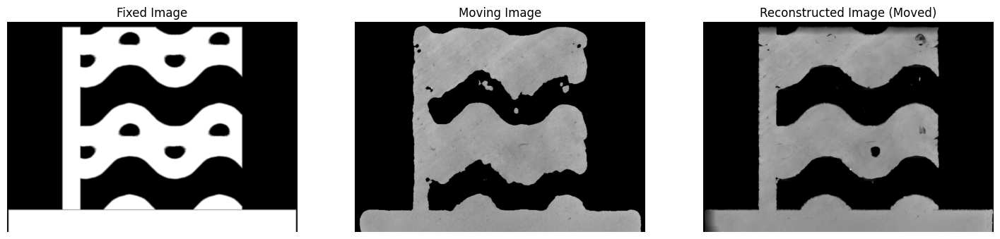

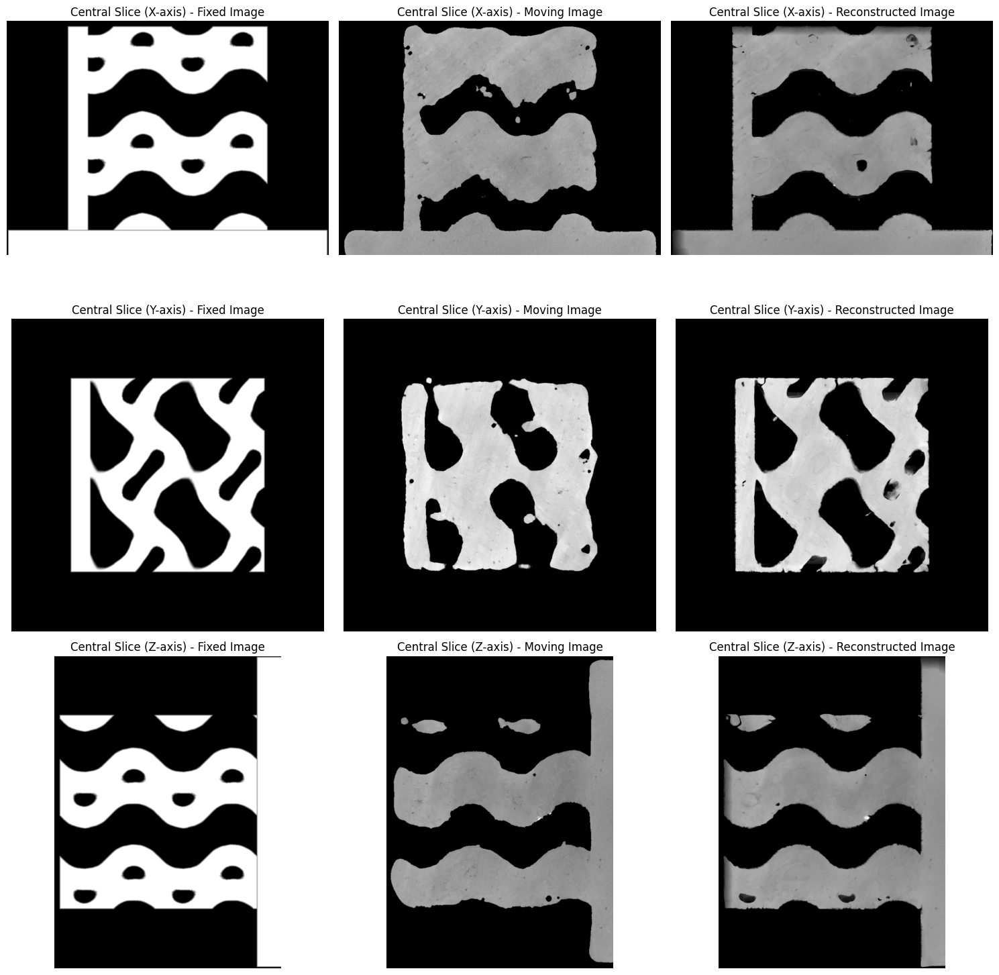

Dice score before non-linear registration on test data is: 0.8213
Dice score after non-linear registration on test data is: 0.9463


In [16]:

reconstructed_moved, reconstructed_displacement, fixed_image, moving_image = next(test_generator)
# Plot the images
plot_images(fixed_image, moving_image, reconstructed_moved)
plot_3x3_images(fixed_image, moving_image, reconstructed_moved)
# calculate Dice score on the data before and aftr non linear reg excluding the base plate
Dice_init = dice_coefficient(fixed_image[:,:530,:], moving_image[:,:530,:])
print(f'Dice score before non-linear registration on test data is: {Dice_init:.4f}')
Dice_after_reg = dice_coefficient(fixed_image[:,:530,:], reconstructed_moved[:,:530,:])
print(f'Dice score after non-linear registration on test data is: {Dice_after_reg:.4f}')


In [17]:
#save data 
save_image_as_vtk(reconstructed_moved, r'/home/kchand/results/TPMS7/stride_64_gaussianw0.5/moved_image.vtk')
save_image_as_vtk(fixed_image, r'/home/kchand/results//TPMS7/stride_64_gaussianw0.5/fixed_image.vtk')
save_image_as_vtk(moving_image, r'/home/kchand/results//TPMS7/stride_64_gaussianw0.5/moving_image.vtk')
save_displacement_vector_as_vtk(reconstructed_displacement, r'/home/kchand/results//TPMS7/stride_64_gaussianw0.5/disp_field.vtk')
save_as_tiff(reconstructed_moved, r'/home/kchand/results//TPMS7/stride_64_gaussianw0.5/reconstructed_moved.tiff')
save_as_tiff(fixed_image, r'/home/kchand/results//TPMS7/stride_64_gaussianw0.5/fixed_image.tiff')
save_as_tiff(moving_image, r'/home/kchand/results//TPMS7/stride_64_gaussianw0.5/moving_image.tiff')



/home/kchand/miniconda3/envs/voxelmorph-env/lib/python3.8/site-packages/pyvista/core/utilities/points.py:55: UserWarning: Points is not a float type. This can cause issues when transforming or applying filters. Casting to ``np.float32``. Disable this by passing ``force_float=False``.
  warnings.warn(


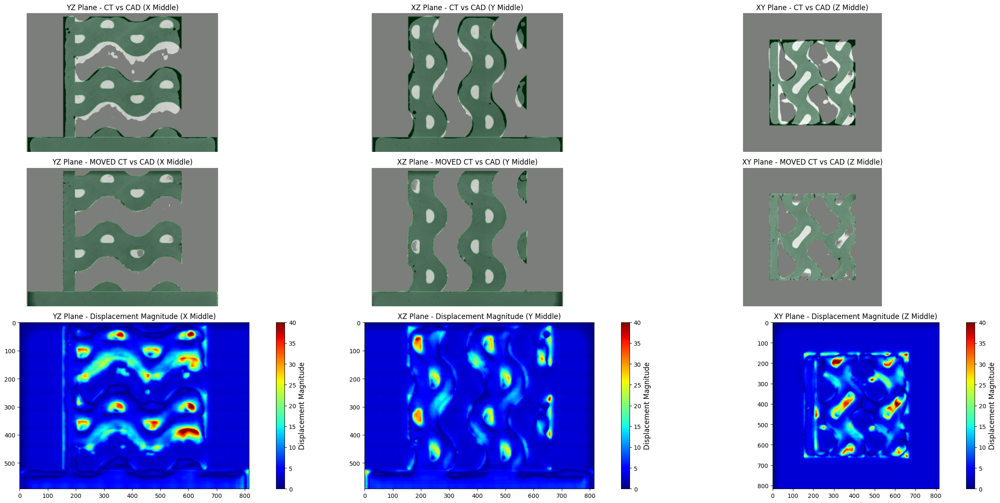

In [18]:
generate_plots_magnitude(moving_image, fixed_image, reconstructed_moved, reconstructed_displacement)

In [19]:
generate_plots_displacement_xyz(ct_image, cad_image, moved_ct, displacement_field)

NameError: name 'ct_image' is not defined

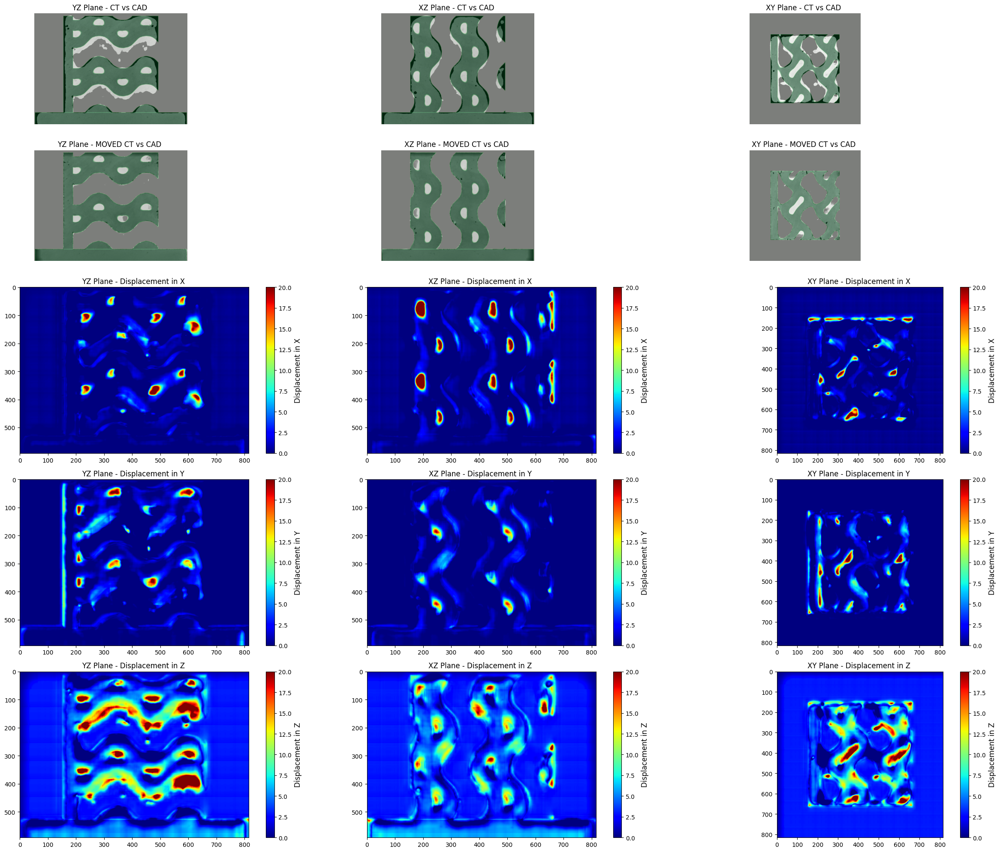

In [20]:
generate_plots_displacement_xyz(moving_image, fixed_image, reconstructed_moved, reconstructed_displacement)

In [21]:


def generate_plots_magnitude(ct_image, cad_image, moved_ct, displacement_field_corrected):
    """Generates a 3x3 figure with:
       - Top row: Alpha-blended overlays of CT & CAD (XY rotated).
       - Middle row: Alpha-blended overlays of MOVED CT & CAD (XY rotated).
       - Bottom row: Centered Displacement Magnitude heatmaps WITH COLORBARS."""

    Dx, Dy, Dz = displacement_field_corrected.shape[:3]
    x_mid, y_mid, z_mid = Dx // 2, Dy // 2, Dz // 2  # Middle slices

    fig = plt.figure(figsize=(25, 12))  # Increased height for better spacing
    gs = gridspec.GridSpec(3, 3, height_ratios=[1, 1, 1.2])  # Make bottom row slightly larger

    axes = np.empty((3, 3), dtype=object)
    for i in range(3):
        for j in range(3):
            axes[i, j] = fig.add_subplot(gs[i, j])

    # ✅ Function to add colorbar with better positioning
    def add_colorbar(ax, img):
        cbar = plt.colorbar(img, ax=ax, fraction=0.046, pad=0.08)
        cbar.set_label("Displacement Magnitude", fontsize=12)

    # ✅ TOP ROW: CT vs CAD overlays
    plot_overlay(axes[0, 0], cad_image[x_mid, :, :], ct_image[x_mid, :, :], "YZ Plane - CT vs CAD (X Middle)",
                 cmap_cad="Greens", cmap_ct="gray")

    plot_overlay(axes[0, 1], np.rot90(cad_image[:, :, z_mid], k=-1),
                 np.rot90(ct_image[:, :, z_mid], k=-1),
                 "XZ Plane - CT vs CAD (Y Middle)", cmap_cad="Greens", cmap_ct="gray")

    plot_overlay(axes[0, 2], cad_image[:, y_mid, :], ct_image[:, y_mid, :], "XY Plane - CT vs CAD (Z Middle)",
                 cmap_cad="Greens", cmap_ct="gray")

    # ✅ MIDDLE ROW: MOVED CT vs CAD overlays
    plot_overlay(axes[1, 0], cad_image[x_mid, :, :], moved_ct[x_mid, :, :], "YZ Plane - MOVED CT vs CAD (X Middle)",
                 cmap_cad="Greens", cmap_ct="gray")

    plot_overlay(axes[1, 1], np.rot90(cad_image[:, :, z_mid], k=-1),
                 np.rot90(moved_ct[:, :, z_mid], k=-1),
                 "XZ Plane - MOVED CT vs CAD (Y Middle)", cmap_cad="Greens", cmap_ct="gray")

    plot_overlay(axes[1, 2], cad_image[:, y_mid, :], moved_ct[:, y_mid, :], "XY Plane - MOVED CT vs CAD (Z Middle)",
                 cmap_cad="Greens", cmap_ct="gray")

    # ✅ BOTTOM ROW: CENTERED Displacement Magnitude heatmaps WITH COLORBARS
    magnitude = np.linalg.norm(displacement_field_corrected, axis=-1)

    img1 = axes[2, 0].imshow(magnitude[x_mid, :, :], cmap="jet", origin="upper", vmin=0, vmax=20)
    axes[2, 0].set_title("YZ Plane - Displacement Magnitude (X Middle)")
    add_colorbar(axes[2, 0], img1)  # Add colorbar

    img2 = axes[2, 1].imshow(np.rot90(magnitude[:, :, z_mid], k=-1), cmap="jet", origin="upper", vmin=0, vmax=20)
    axes[2, 1].set_title("XZ Plane - Displacement Magnitude (Y Middle)")
    add_colorbar(axes[2, 1], img2)  # Add colorbar

    img3 = axes[2, 2].imshow(magnitude[:, y_mid, :], cmap="jet", origin="upper", vmin=0, vmax=20)
    axes[2, 2].set_title("XY Plane - Displacement Magnitude (Z Middle)")
    add_colorbar(axes[2, 2], img3)  # Add colorbar

    plt.tight_layout()
    plt.show(block=True)

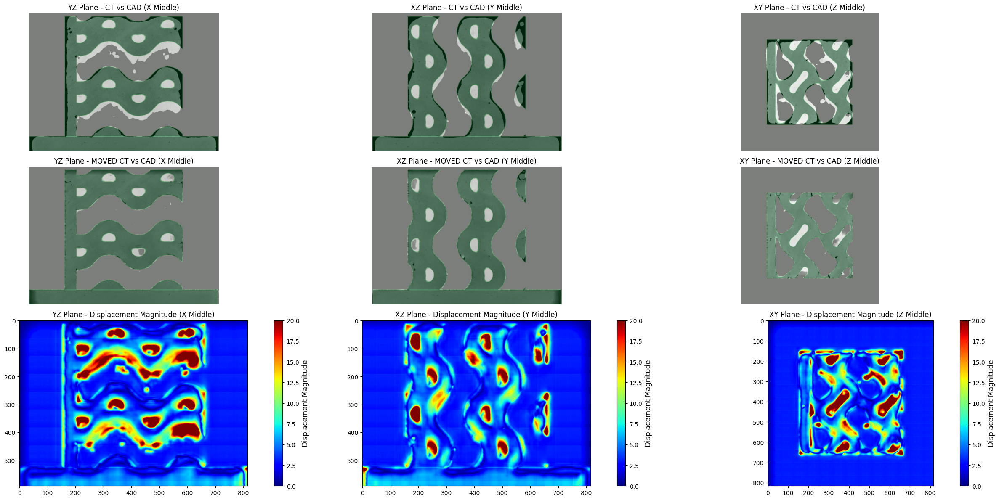

In [22]:
generate_plots_magnitude(moving_image, fixed_image, reconstructed_moved, reconstructed_displacement)

Connected to Python (voxelmorph-env)

In [1]:
generate_plots_displacement_xyz(ct_image, cad_image, moved_ct, displacement_field)

NameError: name 'generate_plots_displacement_xyz' is not defined